In [1]:
pip install matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.5/164.5 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 56.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 325.0/325.0 kB 27.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 44.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 37.2 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.9/106.9 kB 19.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 33.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install lpips

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 7.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [6]:
import os
import torch
import torch.nn as nn
from torch import optim
from torchvision import datasets, transforms
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.utils import save_image
from math import log2
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import torchvision
from torchmetrics.image.fid import FrechetInceptionDistance
import lpips

# # Ensure necessary directories exist
# if not os.path.exists('saved_images_part1'):
#     os.makedirs('saved_images_part1')
# if not os.path.exists('saved_weight_part1'):
#     os.makedirs('saved_weight_part1')
# if not os.path.exists('saved_examples'):
#     os.makedirs('saved_examples')

In [7]:
# Dataset and Training Configuration
DATASET = 'STYLEGAN'  # Corrected variable name
START_TRAIN_IMG_SIZE = 4
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
LR = 1e-3
CHANNELS_IMG = 3
Z_DIM = 512
W_DIM = 512
IN_CHANNELS = 512
LAMBDA_GP = 10

# Batch sizes and number of epochs per training step
BATCH_SIZES = [256, 256, 128, 64, 32, 16, 8]
NUM_EPOCHS_PER_STEP = 45  # You can adjust this to change epochs per step
PROGRESSIVE_EPOCHS = [NUM_EPOCHS_PER_STEP] * len(BATCH_SIZES)
factors = [1, 1, 1, 1/2, 1/4, 1/8, 1/16, 1/32]

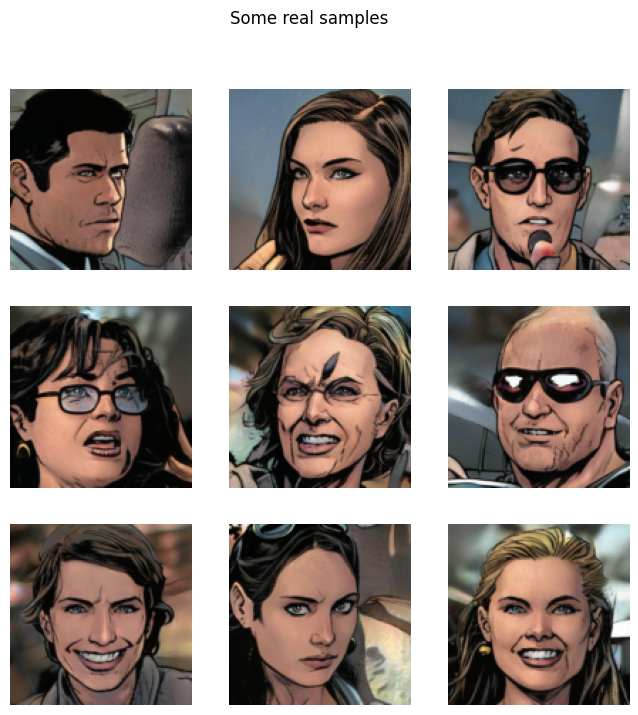

In [8]:
def get_loader(image_size):
    transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5] * CHANNELS_IMG,
            [0.5] * CHANNELS_IMG,
        ),
    ])
    index = int(log2(image_size / 4))
    batch_size = BATCH_SIZES[index]
    dataset = datasets.ImageFolder(root=DATASET, transform=transform)
    loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=4,
        pin_memory=True,
    )
    return loader, dataset



def check_loader():
    loader, _ = get_loader(128)
    cloth, _ = next(iter(loader))
    _, ax = plt.subplots(3, 3, figsize=(8, 8))
    plt.suptitle('Some real samples')
    ind = 0
    for k in range(3):
        for kk in range(3):
            ax[k][kk].imshow((cloth[ind].permute(1, 2, 0) + 1) / 2)
            ax[k][kk].axis('off')
            ind += 1
    plt.show()
check_loader()


In [9]:
class WSLinear(nn.Module):
    def __init__(self, in_features, out_features):
        super(WSLinear, self).__init__()
        self.linear = nn.Linear(in_features, out_features)
        self.scale = (2 / in_features) ** 0.5
        self.bias = self.linear.bias
        self.linear.bias = None

        nn.init.normal_(self.linear.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return self.linear(x * self.scale) + self.bias

class PixelNorm(nn.Module):
    def __init__(self):
        super(PixelNorm, self).__init__()
        self.epsilon = 1e-8

    def forward(self, x):
        return x / torch.sqrt(torch.mean(x ** 2, dim=1, keepdim=True) + self.epsilon)

class MappingNetwork(nn.Module):
    def __init__(self, z_dim, w_dim):
        super(MappingNetwork, self).__init__()
        layers = []
        layers.append(PixelNorm())
        for _ in range(8):
            layers.append(WSLinear(z_dim if _ == 0 else w_dim, w_dim))
            layers.append(nn.ReLU())
        self.mapping = nn.Sequential(*layers)

    def forward(self, x):
        return self.mapping(x)

class AdaIN(nn.Module):
    def __init__(self, channels, w_dim):
        super(AdaIN, self).__init__()
        self.instance_norm = nn.InstanceNorm2d(channels)
        self.style_scale = WSLinear(w_dim, channels)
        self.style_bias = WSLinear(w_dim, channels)

    def forward(self, x, w):
        x = self.instance_norm(x)
        style_scale = self.style_scale(w).unsqueeze(2).unsqueeze(3)
        style_bias = self.style_bias(w).unsqueeze(2).unsqueeze(3)
        return style_scale * x + style_bias

class InjectNoise(nn.Module):
    def __init__(self, channels):
        super(InjectNoise, self).__init__()
        self.weight = nn.Parameter(torch.zeros(1, channels, 1, 1))

    def forward(self, x):
        noise = torch.randn(x.size(0), 1, x.size(2), x.size(3), device=x.device)
        return x + self.weight * noise


class WSConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(WSConv2d, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.scale = (2 / (in_channels * (kernel_size ** 2))) ** 0.5
        self.bias = self.conv.bias
        self.conv.bias = None

        nn.init.normal_(self.conv.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return self.conv(x * self.scale) + self.bias.view(1, -1, 1, 1)


In [10]:
class GenBlock(nn.Module):
    def __init__(self, in_channels, out_channels, w_dim):
        super(GenBlock, self).__init__()
        self.conv1 = WSConv2d(in_channels, out_channels)
        self.conv2 = WSConv2d(out_channels, out_channels)
        self.leaky = nn.LeakyReLU(0.2)
        self.inject_noise1 = InjectNoise(out_channels)
        self.inject_noise2 = InjectNoise(out_channels)
        self.adain1 = AdaIN(out_channels, w_dim)
        self.adain2 = AdaIN(out_channels, w_dim)

    def forward(self, x, w):
        x = self.conv1(x)
        x = self.inject_noise1(x)
        x = self.leaky(x)
        x = self.adain1(x, w)

        x = self.conv2(x)
        x = self.inject_noise2(x)
        x = self.leaky(x)
        x = self.adain2(x, w)
        return x

class Generator(nn.Module):
    def __init__(self, z_dim, w_dim, in_channels, img_channels=3):
        super(Generator, self).__init__()
        self.starting_constant = nn.Parameter(torch.ones(1, in_channels, 4, 4))
        self.map = MappingNetwork(z_dim, w_dim)
        self.initial_adain1 = AdaIN(in_channels, w_dim)
        self.initial_adain2 = AdaIN(in_channels, w_dim)
        self.initial_noise1 = InjectNoise(in_channels)
        self.initial_noise2 = InjectNoise(in_channels)
        self.initial_conv = WSConv2d(in_channels, in_channels)
        self.leaky = nn.LeakyReLU(0.2)

        self.initial_rgb = WSConv2d(in_channels, img_channels, kernel_size=1, stride=1, padding=0)
        self.prog_blocks = nn.ModuleList([])
        self.rgb_layers = nn.ModuleList([self.initial_rgb])

        for i in range(len(factors) - 1):
            conv_in_c = int(in_channels * factors[i])
            conv_out_c = int(in_channels * factors[i + 1])
            self.prog_blocks.append(GenBlock(conv_in_c, conv_out_c, w_dim))
            self.rgb_layers.append(WSConv2d(conv_out_c, img_channels, kernel_size=1, stride=1, padding=0))

    def fade_in(self, alpha, upscaled, generated):
        return torch.tanh(alpha * generated + (1 - alpha) * upscaled)

    def forward(self, noise, alpha, steps):
        w = self.map(noise)
        x = self.starting_constant.expand(noise.size(0), -1, 4, 4)
        x = self.initial_noise1(x)
        x = self.leaky(x)
        x = self.initial_adain1(x, w)

        x = self.initial_conv(x)
        x = self.initial_noise2(x)
        x = self.leaky(x)
        x = self.initial_adain2(x, w)

        if steps == 0:
            out = self.initial_rgb(x)
            return out

        for step in range(steps):
            upscaled = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)
            x = self.prog_blocks[step](upscaled, w)

        out = self.rgb_layers[steps](x)
        upscaled_rgb = self.rgb_layers[steps - 1](upscaled)
        final_out = self.fade_in(alpha, upscaled_rgb, out)
        return final_out


In [11]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv1 = WSConv2d(in_channels, out_channels)
        self.conv2 = WSConv2d(out_channels, out_channels)
        self.leaky = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = self.leaky(self.conv1(x))
        x = self.leaky(self.conv2(x))
        return x

class Discriminator(nn.Module):
    def __init__(self, in_channels, img_channels=3):
        super(Discriminator, self).__init__()
        self.prog_blocks = nn.ModuleList([])
        self.rgb_layers = nn.ModuleList([])
        self.leaky = nn.LeakyReLU(0.2)

        for i in range(len(factors) - 1, 0, -1):
            conv_in_c = int(in_channels * factors[i])
            conv_out_c = int(in_channels * factors[i - 1])
            self.prog_blocks.append(ConvBlock(conv_in_c, conv_out_c))
            self.rgb_layers.append(WSConv2d(img_channels, conv_in_c, kernel_size=1, stride=1, padding=0))

        self.initial_rgb = WSConv2d(img_channels, in_channels, kernel_size=1, stride=1, padding=0)
        self.rgb_layers.append(self.initial_rgb)

        self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)

        self.final_block = nn.Sequential(
            WSConv2d(in_channels + 1, in_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=4, padding=0, stride=1),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, 1, kernel_size=1, padding=0, stride=1)
        )

    def fade_in(self, alpha, downscaled, out):
        return alpha * out + (1 - alpha) * downscaled

    def minibatch_std(self, x):
        batch_std = torch.std(x, dim=0, unbiased=False).mean().expand(x.size(0), 1, x.size(2), x.size(3))
        return torch.cat([x, batch_std], dim=1)

    def forward(self, x, alpha, steps):
        cur_step = len(self.prog_blocks) - steps

        out = self.leaky(self.rgb_layers[cur_step](x))

        if steps == 0:
            out = self.minibatch_std(out)
            out = self.final_block(out)
            return out.view(out.size(0), -1)

        downscaled = self.leaky(self.rgb_layers[cur_step + 1](self.avg_pool(x)))
        out = self.avg_pool(self.prog_blocks[cur_step](out))
        out = self.fade_in(alpha, downscaled, out)

        for step in range(cur_step + 1, len(self.prog_blocks)):
            out = self.prog_blocks[step](out)
            out = self.avg_pool(out)

        out = self.minibatch_std(out)
        out = self.final_block(out)
        return out.view(out.size(0), -1)


In [12]:
def gradient_penalty(critic, real, fake, alpha, train_step, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    beta = torch.rand(BATCH_SIZE, 1, 1, 1).to(device)
    beta = beta.expand_as(real)
    interpolated_images = beta * real + (1 - beta) * fake.detach()
    interpolated_images.requires_grad_(True)

    mixed_scores = critic(interpolated_images, alpha, train_step)

    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]

    gradient = gradient.view(gradient.size(0), -1)
    gradient_norm = gradient.norm(2, dim=1)
    gp = torch.mean((gradient_norm - 1) ** 2)
    return gp


In [13]:
def generate_examples(gen, steps, n=100):
    gen.eval()
    alpha = 1.0
    for i in range(n):
        with torch.no_grad():
            noise = torch.randn(1, Z_DIM).to(DEVICE)
            img = gen(noise, alpha, steps)
            img = img * 0.5 + 0.5  # Denormalize
            if not os.path.exists(f'saved_examples/step{steps}'):
                os.makedirs(f'saved_examples/step{steps}')
            save_image(img, f"saved_examples/step{steps}/img_{i}.png")
    gen.train()


In [14]:
def train_fn(critic, gen, loader, dataset, step, alpha, opt_critic, opt_gen):
    loop = tqdm(loader, leave=True)
    loss_critic_epoch = 0
    loss_gen_epoch = 0
    n_batches = len(loader)
    for batch_idx, (real, _) in enumerate(loop):
        real = real.to(DEVICE)
        cur_batch_size = real.size(0)
        noise = torch.randn(cur_batch_size, Z_DIM).to(DEVICE)
        fake = gen(noise, alpha, step)

        critic_real = critic(real, alpha, step)
        critic_fake = critic(fake.detach(), alpha, step)
        gp = gradient_penalty(critic, real, fake, alpha, step, DEVICE)
        loss_critic = (
            -(torch.mean(critic_real) - torch.mean(critic_fake))
            + LAMBDA_GP * gp
            + 0.001 * torch.mean(critic_real ** 2)
        )

        critic.zero_grad()
        loss_critic.backward()
        opt_critic.step()

        gen_fake = critic(fake, alpha, step)
        loss_gen = -torch.mean(gen_fake)

        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        alpha += cur_batch_size / (PROGRESSIVE_EPOCHS[step] * 0.5 * len(dataset))
        alpha = min(alpha, 1)

        loss_critic_epoch += loss_critic.item()
        loss_gen_epoch += loss_gen.item()

        loop.set_postfix(
            gp=gp.item(),
            loss_critic=loss_critic.item(),
            loss_gen=loss_gen.item(),
            alpha=alpha
        )

    avg_loss_critic = loss_critic_epoch / n_batches
    avg_loss_gen = loss_gen_epoch / n_batches
    return alpha, avg_loss_critic, avg_loss_gen


In [15]:
def compute_fid_score(gen, real_loader, step, num_images=5000, batch_size=50):
    fid = FrechetInceptionDistance(feature=2048, normalize=True).to(DEVICE)
    gen.eval()
    alpha = 1.0  # Use full contribution from the new block

    # Collect real images
    num_real_images = 0
    with torch.no_grad():
        for real_batch, _ in tqdm(real_loader, desc='Collecting real images'):
            real_batch = real_batch.to(DEVICE)
            remaining_images = num_images - num_real_images
            if real_batch.size(0) > remaining_images:
                real_batch = real_batch[:remaining_images]
            fid.update(real_batch, real=True)
            num_real_images += real_batch.size(0)
            if num_real_images >= num_images:
                break

    # Generate fake images
    num_fake_images = 0
    while num_fake_images < num_images:
        current_batch_size = min(batch_size, num_images - num_fake_images)
        with torch.no_grad():
            noise = torch.randn(current_batch_size, Z_DIM).to(DEVICE)
            fake_batch = gen(noise, alpha, step)
            fid.update(fake_batch, real=False)
            num_fake_images += fake_batch.size(0)

    fid_score = fid.compute().item()
    gen.train()
    return fid_score


In [16]:
def compute_ppl(gen, step, num_samples=10000, eps=1e-4, batch_size=10):
    loss_fn = lpips.LPIPS(net='vgg').to(DEVICE)
    gen.eval()
    distances = []
    n_batches = num_samples // batch_size
    alpha = 1.0  # Use full contribution from the new block
    for _ in tqdm(range(n_batches), desc='Computing PPL'):
        z1 = torch.randn(batch_size, Z_DIM).to(DEVICE)
        z2 = z1 + eps * torch.randn_like(z1).to(DEVICE)
        with torch.no_grad():
            img1 = gen(z1, alpha, step)
            img2 = gen(z2, alpha, step)
        dist = loss_fn(img1, img2)
        distances.append(dist.view(-1))
    distances = torch.cat(distances)
    ppl_score = (distances ** 2).mean().sqrt().item() / (eps ** 2)
    gen.train()
    return ppl_score


In [17]:
gen = Generator(Z_DIM, W_DIM, IN_CHANNELS, CHANNELS_IMG).to(DEVICE)
critic = Discriminator(IN_CHANNELS, CHANNELS_IMG).to(DEVICE)

opt_gen = optim.Adam(
    [
        {'params': [param for name, param in gen.named_parameters() if 'map' not in name]},
        {'params': gen.map.parameters(), 'lr': 1e-5}
    ], lr=LR, betas=(0.0, 0.99)
)

opt_critic = optim.Adam(
    critic.parameters(), lr=LR, betas=(0.0, 0.99)
)

gen.train()
critic.train()


Discriminator(
  (prog_blocks): ModuleList(
    (0): ConvBlock(
      (conv1): WSConv2d(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (conv2): WSConv2d(
        (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (leaky): LeakyReLU(negative_slope=0.2)
    )
    (1): ConvBlock(
      (conv1): WSConv2d(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (conv2): WSConv2d(
        (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (leaky): LeakyReLU(negative_slope=0.2)
    )
    (2): ConvBlock(
      (conv1): WSConv2d(
        (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (conv2): WSConv2d(
        (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (leaky): LeakyReLU(nega

Current image size: 4
Batch size: 256
Total epochs to run: 45
-----------------------------------------------
Epoch [1/45]


100%|██████████| 40/40 [00:11<00:00,  3.46it/s, alpha=0.0444, gp=0.107, loss_critic=-5.69, loss_gen=8.22] 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2252727..1.8321266].


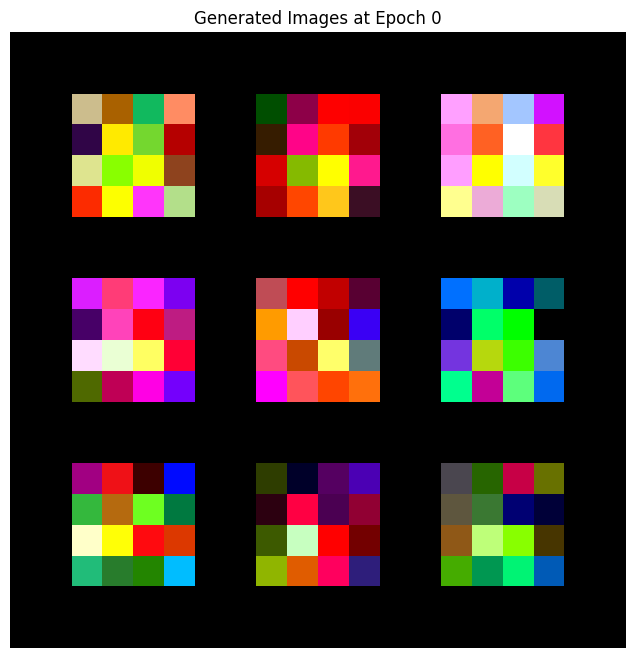

Epoch [2/45]


100%|██████████| 40/40 [00:11<00:00,  3.52it/s, alpha=0.0889, gp=0.0904, loss_critic=-4.62, loss_gen=5.87]


Epoch [3/45]


100%|██████████| 40/40 [00:10<00:00,  3.66it/s, alpha=0.133, gp=0.0926, loss_critic=-3.02, loss_gen=3.33]


Epoch [4/45]


100%|██████████| 40/40 [00:11<00:00,  3.56it/s, alpha=0.178, gp=0.0722, loss_critic=-3.4, loss_gen=3.62] 


Epoch [5/45]


100%|██████████| 40/40 [00:10<00:00,  3.68it/s, alpha=0.222, gp=0.0453, loss_critic=-3.06, loss_gen=2.8] 


Epoch [6/45]


100%|██████████| 40/40 [00:10<00:00,  3.74it/s, alpha=0.267, gp=0.0324, loss_critic=-2.87, loss_gen=2.39]


Epoch [7/45]


100%|██████████| 40/40 [00:10<00:00,  3.76it/s, alpha=0.311, gp=0.0434, loss_critic=-2.92, loss_gen=2.38]


Epoch [8/45]


100%|██████████| 40/40 [00:10<00:00,  3.78it/s, alpha=0.356, gp=0.024, loss_critic=-2.34, loss_gen=1.59] 


Epoch [9/45]


100%|██████████| 40/40 [00:10<00:00,  3.71it/s, alpha=0.4, gp=0.0176, loss_critic=-2.87, loss_gen=3.16]  


Epoch [10/45]


100%|██████████| 40/40 [00:10<00:00,  3.73it/s, alpha=0.444, gp=0.0191, loss_critic=-2.34, loss_gen=2.3] 


Epoch [11/45]


100%|██████████| 40/40 [00:10<00:00,  3.70it/s, alpha=0.489, gp=0.0212, loss_critic=-1.73, loss_gen=1.13]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.30981386..1.0155017].


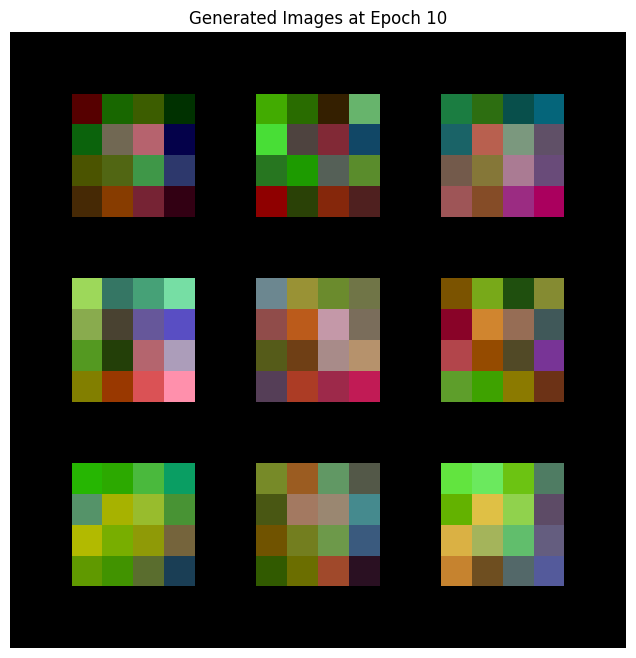

Epoch [12/45]


100%|██████████| 40/40 [00:10<00:00,  3.77it/s, alpha=0.533, gp=0.0161, loss_critic=-1.91, loss_gen=1.34]


Epoch [13/45]


100%|██████████| 40/40 [00:10<00:00,  3.69it/s, alpha=0.578, gp=0.0208, loss_critic=-1.44, loss_gen=0.922]


Epoch [14/45]


100%|██████████| 40/40 [00:11<00:00,  3.62it/s, alpha=0.622, gp=0.00968, loss_critic=-1.58, loss_gen=1.77]


Epoch [15/45]


100%|██████████| 40/40 [00:11<00:00,  3.58it/s, alpha=0.667, gp=0.0424, loss_critic=-1.97, loss_gen=1.26] 


Epoch [16/45]


100%|██████████| 40/40 [00:11<00:00,  3.53it/s, alpha=0.711, gp=0.0299, loss_critic=-1.5, loss_gen=1.54]  


Epoch [17/45]


100%|██████████| 40/40 [00:10<00:00,  3.65it/s, alpha=0.756, gp=0.0156, loss_critic=-1.68, loss_gen=1.57] 


Epoch [18/45]


100%|██████████| 40/40 [00:10<00:00,  3.68it/s, alpha=0.8, gp=0.0306, loss_critic=-2, loss_gen=2.09]      


Epoch [19/45]


100%|██████████| 40/40 [00:11<00:00,  3.53it/s, alpha=0.844, gp=0.0204, loss_critic=-1.46, loss_gen=2.14] 


Epoch [20/45]


100%|██████████| 40/40 [00:10<00:00,  3.65it/s, alpha=0.889, gp=0.0082, loss_critic=-1.89, loss_gen=2.54]


Epoch [21/45]


100%|██████████| 40/40 [00:10<00:00,  3.78it/s, alpha=0.933, gp=0.025, loss_critic=-1.01, loss_gen=1.02]  
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.29616624..0.91069084].


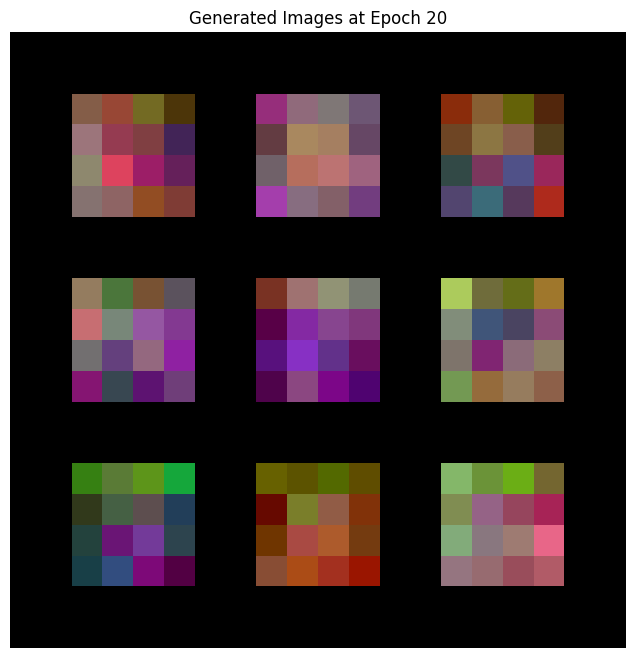

Epoch [22/45]


100%|██████████| 40/40 [00:10<00:00,  3.78it/s, alpha=0.978, gp=0.009, loss_critic=-1.13, loss_gen=1.13]  


Epoch [23/45]


100%|██████████| 40/40 [00:10<00:00,  3.75it/s, alpha=1, gp=0.0143, loss_critic=-.843, loss_gen=0.921]    


Epoch [24/45]


100%|██████████| 40/40 [00:10<00:00,  3.72it/s, alpha=1, gp=0.00567, loss_critic=-1.23, loss_gen=1.79]


Epoch [25/45]


100%|██████████| 40/40 [00:10<00:00,  3.75it/s, alpha=1, gp=0.0378, loss_critic=-.808, loss_gen=1.05] 


Epoch [26/45]


100%|██████████| 40/40 [00:10<00:00,  3.68it/s, alpha=1, gp=0.0079, loss_critic=-1.15, loss_gen=1.35] 


Epoch [27/45]


100%|██████████| 40/40 [00:10<00:00,  3.73it/s, alpha=1, gp=0.0181, loss_critic=-1.14, loss_gen=1.68] 


Epoch [28/45]


100%|██████████| 40/40 [00:10<00:00,  3.76it/s, alpha=1, gp=0.0175, loss_critic=-.77, loss_gen=0.877] 


Epoch [29/45]


100%|██████████| 40/40 [00:10<00:00,  3.75it/s, alpha=1, gp=0.00632, loss_critic=-1.32, loss_gen=2.67]


Epoch [30/45]


100%|██████████| 40/40 [00:10<00:00,  3.69it/s, alpha=1, gp=0.0176, loss_critic=-.954, loss_gen=1.15] 


Epoch [31/45]


100%|██████████| 40/40 [00:10<00:00,  3.75it/s, alpha=1, gp=0.0115, loss_critic=-1.23, loss_gen=1.69]  
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008095682..0.9529327].


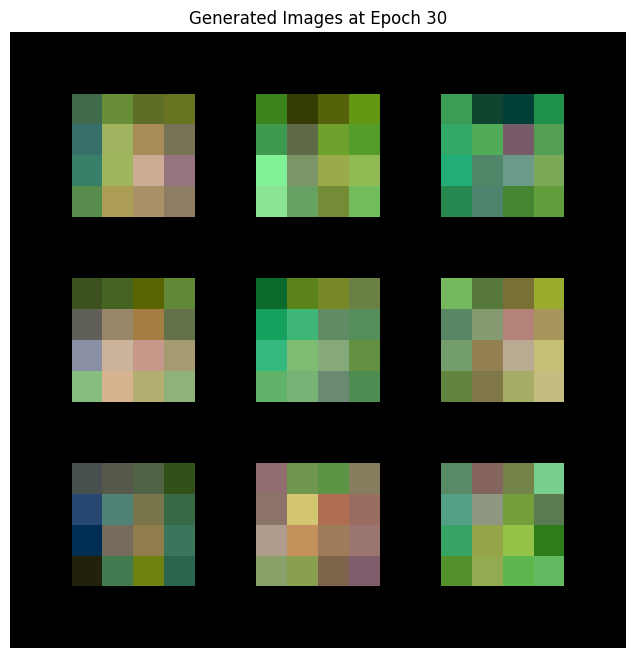

Epoch [32/45]


100%|██████████| 40/40 [00:10<00:00,  3.73it/s, alpha=1, gp=0.0262, loss_critic=-.76, loss_gen=0.831] 


Epoch [33/45]


100%|██████████| 40/40 [00:10<00:00,  3.71it/s, alpha=1, gp=0.0317, loss_critic=-.539, loss_gen=0.778] 


Epoch [34/45]


100%|██████████| 40/40 [00:10<00:00,  3.71it/s, alpha=1, gp=0.0205, loss_critic=-.982, loss_gen=1.43]  


Epoch [35/45]


100%|██████████| 40/40 [00:10<00:00,  3.75it/s, alpha=1, gp=0.00801, loss_critic=-.867, loss_gen=0.928]


Epoch [36/45]


100%|██████████| 40/40 [00:10<00:00,  3.76it/s, alpha=1, gp=0.0102, loss_critic=-.793, loss_gen=1.42]  


Epoch [37/45]


100%|██████████| 40/40 [00:10<00:00,  3.77it/s, alpha=1, gp=0.00787, loss_critic=-.765, loss_gen=0.964]


Epoch [38/45]


100%|██████████| 40/40 [00:10<00:00,  3.80it/s, alpha=1, gp=0.0188, loss_critic=-.609, loss_gen=0.807] 


Epoch [39/45]


100%|██████████| 40/40 [00:11<00:00,  3.59it/s, alpha=1, gp=0.0101, loss_critic=-.69, loss_gen=0.976]  


Epoch [40/45]


100%|██████████| 40/40 [00:10<00:00,  3.74it/s, alpha=1, gp=0.00609, loss_critic=-.971, loss_gen=1.84] 


Epoch [41/45]


100%|██████████| 40/40 [00:10<00:00,  3.73it/s, alpha=1, gp=0.0107, loss_critic=-.743, loss_gen=1.15]  
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14033186..0.91302454].


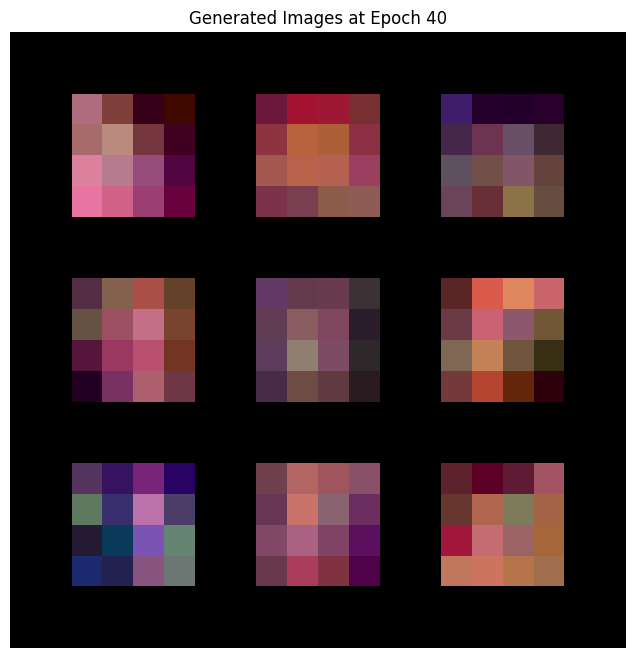

Epoch [42/45]


100%|██████████| 40/40 [00:10<00:00,  3.71it/s, alpha=1, gp=0.00496, loss_critic=-.736, loss_gen=1.12] 


Epoch [43/45]


100%|██████████| 40/40 [00:10<00:00,  3.73it/s, alpha=1, gp=0.0154, loss_critic=-.625, loss_gen=0.997] 


Epoch [44/45]


100%|██████████| 40/40 [00:10<00:00,  3.78it/s, alpha=1, gp=0.01, loss_critic=-.821, loss_gen=1.36]    


Epoch [45/45]


100%|██████████| 40/40 [00:10<00:00,  3.70it/s, alpha=1, gp=0.00694, loss_critic=-.742, loss_gen=1.03] 
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14313406..0.7463099].


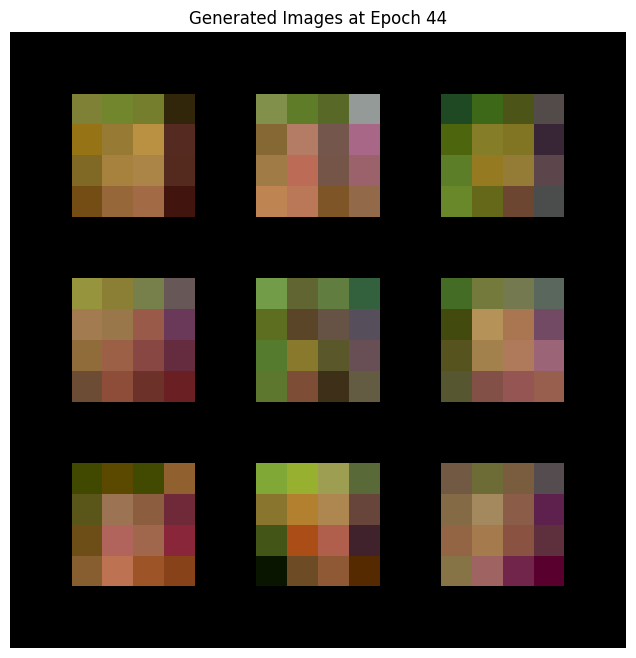

FID score at step 0: 31.05714225769043
PPL will be computed after training using saved weights.
Current image size: 8
Batch size: 256
Total epochs to run: 45
-----------------------------------------------
Epoch [1/45]


100%|██████████| 40/40 [00:11<00:00,  3.61it/s, alpha=0.0444, gp=0.0294, loss_critic=-1.52, loss_gen=1.85] 


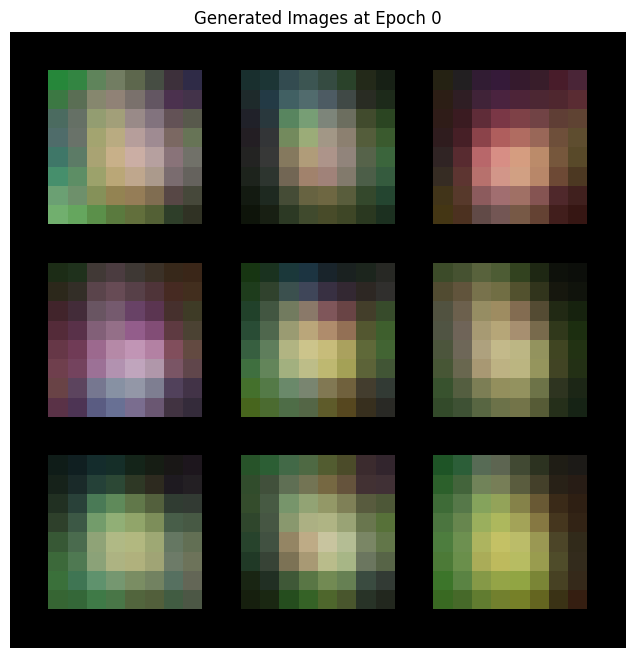

Epoch [2/45]


100%|██████████| 40/40 [00:10<00:00,  3.65it/s, alpha=0.0889, gp=0.0236, loss_critic=-1.14, loss_gen=1.88]


Epoch [3/45]


100%|██████████| 40/40 [00:11<00:00,  3.63it/s, alpha=0.133, gp=0.0201, loss_critic=-1.09, loss_gen=1.1] 


Epoch [4/45]


100%|██████████| 40/40 [00:11<00:00,  3.59it/s, alpha=0.178, gp=0.0157, loss_critic=-.75, loss_gen=1.81]  


Epoch [5/45]


100%|██████████| 40/40 [00:11<00:00,  3.63it/s, alpha=0.222, gp=0.0304, loss_critic=-1.16, loss_gen=2.08]


Epoch [6/45]


100%|██████████| 40/40 [00:10<00:00,  3.65it/s, alpha=0.267, gp=0.0165, loss_critic=-.962, loss_gen=0.767]


Epoch [7/45]


100%|██████████| 40/40 [00:11<00:00,  3.62it/s, alpha=0.311, gp=0.0232, loss_critic=-.934, loss_gen=1.5]  


Epoch [8/45]


100%|██████████| 40/40 [00:10<00:00,  3.68it/s, alpha=0.356, gp=0.0161, loss_critic=-1.19, loss_gen=1.6]  


Epoch [9/45]


100%|██████████| 40/40 [00:11<00:00,  3.59it/s, alpha=0.4, gp=0.0107, loss_critic=-1.04, loss_gen=1.25]   


Epoch [10/45]


100%|██████████| 40/40 [00:10<00:00,  3.64it/s, alpha=0.444, gp=0.0321, loss_critic=-1.17, loss_gen=0.432]


Epoch [11/45]


100%|██████████| 40/40 [00:10<00:00,  3.64it/s, alpha=0.489, gp=0.0286, loss_critic=-1.61, loss_gen=1.69] 


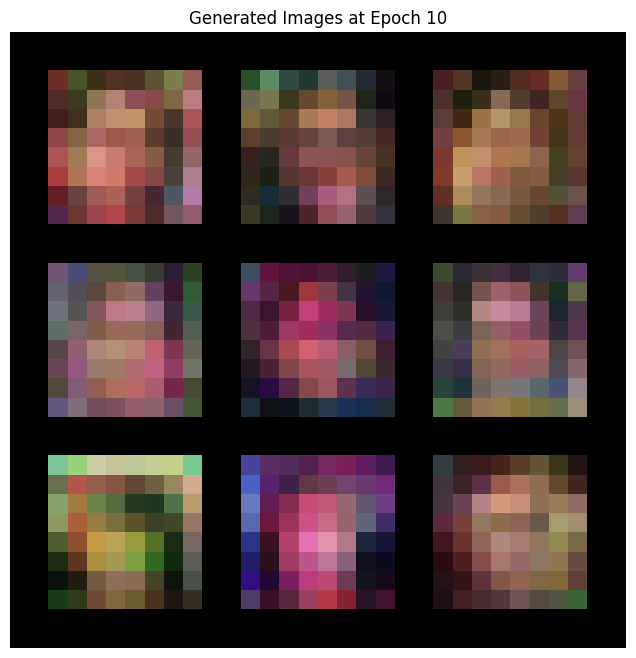

Epoch [12/45]


100%|██████████| 40/40 [00:11<00:00,  3.62it/s, alpha=0.533, gp=0.0143, loss_critic=-1.47, loss_gen=1.49]


Epoch [13/45]


100%|██████████| 40/40 [00:10<00:00,  3.68it/s, alpha=0.578, gp=0.0299, loss_critic=-1.42, loss_gen=1.4] 


Epoch [14/45]


100%|██████████| 40/40 [00:11<00:00,  3.61it/s, alpha=0.622, gp=0.0201, loss_critic=-1.46, loss_gen=1.87]


Epoch [15/45]


100%|██████████| 40/40 [00:11<00:00,  3.56it/s, alpha=0.667, gp=0.0368, loss_critic=-1.49, loss_gen=2.12]


Epoch [16/45]


100%|██████████| 40/40 [00:11<00:00,  3.53it/s, alpha=0.711, gp=0.0208, loss_critic=-1.04, loss_gen=1.39]


Epoch [17/45]


100%|██████████| 40/40 [00:11<00:00,  3.63it/s, alpha=0.756, gp=0.0287, loss_critic=-1.04, loss_gen=1.18]


Epoch [18/45]


100%|██████████| 40/40 [00:11<00:00,  3.61it/s, alpha=0.8, gp=0.0152, loss_critic=-1.39, loss_gen=1.98]  


Epoch [19/45]


100%|██████████| 40/40 [00:10<00:00,  3.65it/s, alpha=0.844, gp=0.0161, loss_critic=-1.38, loss_gen=2.22]


Epoch [20/45]


100%|██████████| 40/40 [00:11<00:00,  3.62it/s, alpha=0.889, gp=0.0158, loss_critic=-1.38, loss_gen=1.97]


Epoch [21/45]


100%|██████████| 40/40 [00:11<00:00,  3.63it/s, alpha=0.933, gp=0.0148, loss_critic=-1.42, loss_gen=1.92]


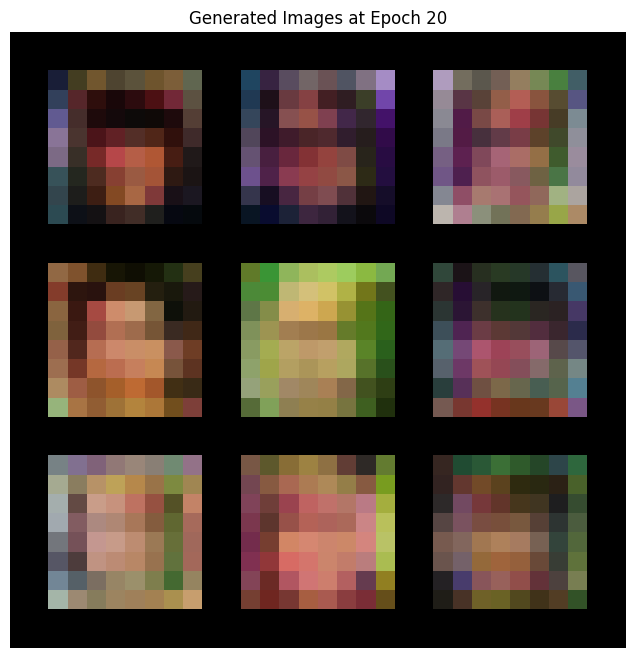

Epoch [22/45]


100%|██████████| 40/40 [00:11<00:00,  3.61it/s, alpha=0.978, gp=0.0303, loss_critic=-1.43, loss_gen=0.372]


Epoch [23/45]


100%|██████████| 40/40 [00:10<00:00,  3.64it/s, alpha=1, gp=0.0293, loss_critic=-1.5, loss_gen=3.65]     


Epoch [24/45]


100%|██████████| 40/40 [00:10<00:00,  3.64it/s, alpha=1, gp=0.0168, loss_critic=-.975, loss_gen=1.02]


Epoch [25/45]


100%|██████████| 40/40 [00:11<00:00,  3.58it/s, alpha=1, gp=0.0132, loss_critic=-1.24, loss_gen=2.09]


Epoch [26/45]


100%|██████████| 40/40 [00:11<00:00,  3.63it/s, alpha=1, gp=0.0119, loss_critic=-1.15, loss_gen=1.48] 


Epoch [27/45]


100%|██████████| 40/40 [00:11<00:00,  3.55it/s, alpha=1, gp=0.0222, loss_critic=-1.12, loss_gen=1.62] 


Epoch [28/45]


100%|██████████| 40/40 [00:11<00:00,  3.63it/s, alpha=1, gp=0.0155, loss_critic=-.947, loss_gen=0.856]


Epoch [29/45]


100%|██████████| 40/40 [00:11<00:00,  3.59it/s, alpha=1, gp=0.0283, loss_critic=-1.29, loss_gen=1.75] 


Epoch [30/45]


100%|██████████| 40/40 [00:11<00:00,  3.62it/s, alpha=1, gp=0.0139, loss_critic=-1.09, loss_gen=1.37] 


Epoch [31/45]


100%|██████████| 40/40 [00:11<00:00,  3.61it/s, alpha=1, gp=0.0125, loss_critic=-1.06, loss_gen=1.52] 


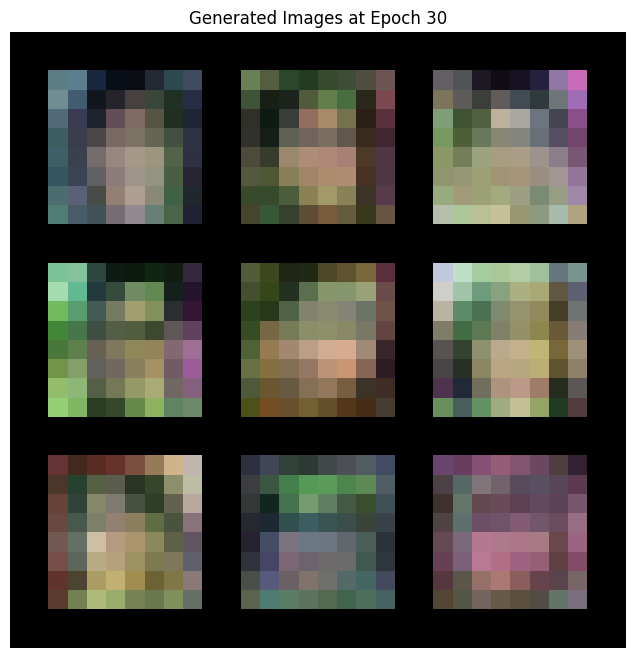

Epoch [32/45]


100%|██████████| 40/40 [00:11<00:00,  3.61it/s, alpha=1, gp=0.0189, loss_critic=-.878, loss_gen=0.968]


Epoch [33/45]


100%|██████████| 40/40 [00:10<00:00,  3.64it/s, alpha=1, gp=0.0149, loss_critic=-.941, loss_gen=1.65] 


Epoch [34/45]


100%|██████████| 40/40 [00:10<00:00,  3.64it/s, alpha=1, gp=0.0146, loss_critic=-.619, loss_gen=1.35] 


Epoch [35/45]


100%|██████████| 40/40 [00:11<00:00,  3.60it/s, alpha=1, gp=0.0133, loss_critic=-.918, loss_gen=1.23] 


Epoch [36/45]


100%|██████████| 40/40 [00:11<00:00,  3.54it/s, alpha=1, gp=0.0094, loss_critic=-1.16, loss_gen=2.53] 


Epoch [37/45]


100%|██████████| 40/40 [00:11<00:00,  3.57it/s, alpha=1, gp=0.0198, loss_critic=-.512, loss_gen=0.465]


Epoch [38/45]


100%|██████████| 40/40 [00:11<00:00,  3.62it/s, alpha=1, gp=0.0169, loss_critic=-.642, loss_gen=0.952]


Epoch [39/45]


100%|██████████| 40/40 [00:11<00:00,  3.54it/s, alpha=1, gp=0.0118, loss_critic=-1.14, loss_gen=1.76] 


Epoch [40/45]


100%|██████████| 40/40 [00:11<00:00,  3.60it/s, alpha=1, gp=0.00624, loss_critic=-.702, loss_gen=1.73] 


Epoch [41/45]


100%|██████████| 40/40 [00:11<00:00,  3.63it/s, alpha=1, gp=0.0111, loss_critic=-.87, loss_gen=1.65]  


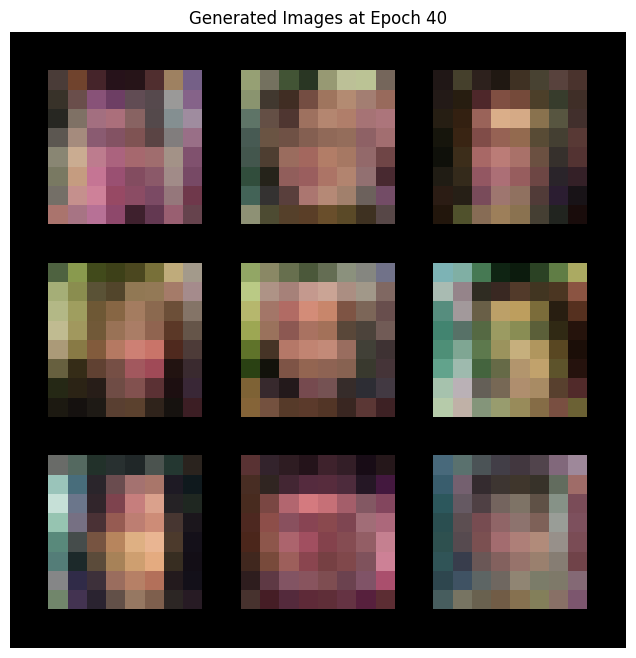

Epoch [42/45]


100%|██████████| 40/40 [00:10<00:00,  3.65it/s, alpha=1, gp=0.0127, loss_critic=-.44, loss_gen=0.739]  


Epoch [43/45]


100%|██████████| 40/40 [00:11<00:00,  3.59it/s, alpha=1, gp=0.00577, loss_critic=-.566, loss_gen=1.17] 


Epoch [44/45]


100%|██████████| 40/40 [00:11<00:00,  3.63it/s, alpha=1, gp=0.0106, loss_critic=-.472, loss_gen=0.838] 


Epoch [45/45]


100%|██████████| 40/40 [00:11<00:00,  3.59it/s, alpha=1, gp=0.00737, loss_critic=-.603, loss_gen=1.21] 


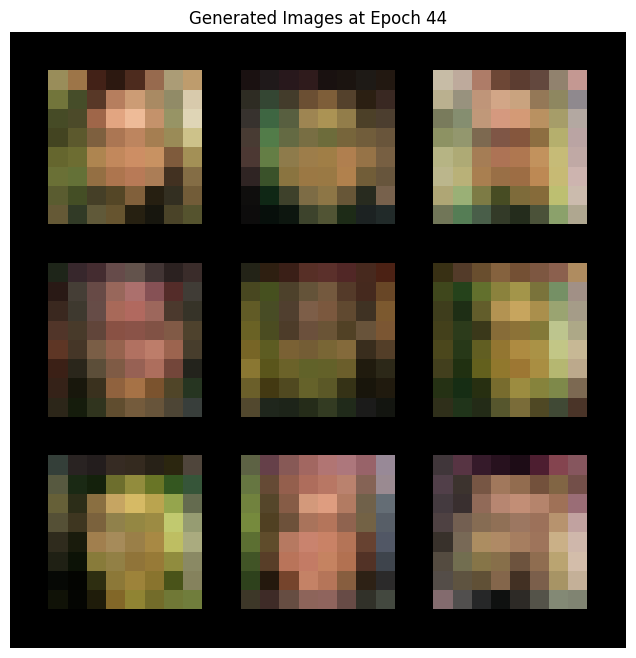

FID score at step 1: 23.745210647583008
PPL will be computed after training using saved weights.
Current image size: 16
Batch size: 128
Total epochs to run: 45
-----------------------------------------------
Epoch [1/45]


100%|██████████| 79/79 [00:14<00:00,  5.52it/s, alpha=0.0444, gp=0.0303, loss_critic=-.994, loss_gen=-.213] 


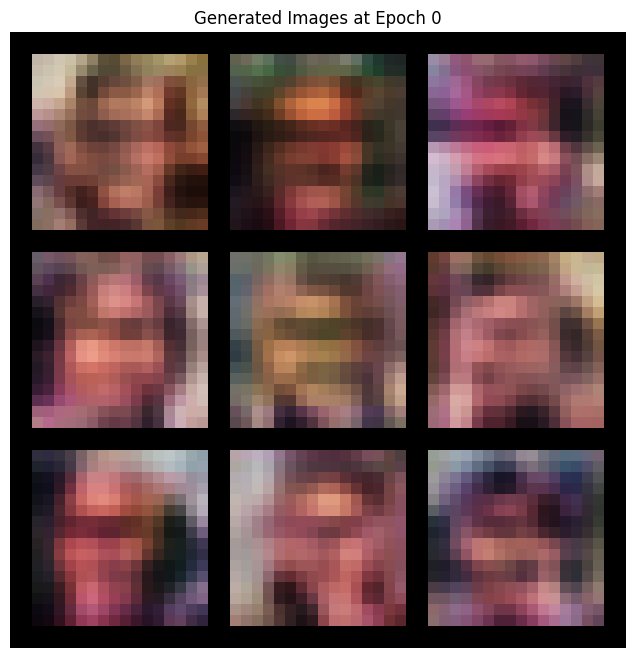

Epoch [2/45]


100%|██████████| 79/79 [00:14<00:00,  5.59it/s, alpha=0.0889, gp=0.0166, loss_critic=-1.43, loss_gen=1.48] 


Epoch [3/45]


100%|██████████| 79/79 [00:14<00:00,  5.56it/s, alpha=0.133, gp=0.0124, loss_critic=-.983, loss_gen=1.09]  


Epoch [4/45]


100%|██████████| 79/79 [00:14<00:00,  5.57it/s, alpha=0.178, gp=0.0546, loss_critic=-1.01, loss_gen=0.594]


Epoch [5/45]


100%|██████████| 79/79 [00:14<00:00,  5.53it/s, alpha=0.222, gp=0.0645, loss_critic=-1.47, loss_gen=2.14] 


Epoch [6/45]


100%|██████████| 79/79 [00:14<00:00,  5.55it/s, alpha=0.267, gp=0.015, loss_critic=-1.64, loss_gen=2.24]  


Epoch [7/45]


100%|██████████| 79/79 [00:14<00:00,  5.57it/s, alpha=0.311, gp=0.0268, loss_critic=-.898, loss_gen=2.4] 


Epoch [8/45]


100%|██████████| 79/79 [00:14<00:00,  5.55it/s, alpha=0.356, gp=0.0477, loss_critic=-1.44, loss_gen=4.16] 


Epoch [9/45]


100%|██████████| 79/79 [00:14<00:00,  5.55it/s, alpha=0.4, gp=0.0148, loss_critic=-1.38, loss_gen=1.07]   


Epoch [10/45]


100%|██████████| 79/79 [00:14<00:00,  5.57it/s, alpha=0.444, gp=0.0128, loss_critic=-1.38, loss_gen=1.07]


Epoch [11/45]


100%|██████████| 79/79 [00:14<00:00,  5.57it/s, alpha=0.489, gp=0.0244, loss_critic=-1.92, loss_gen=6.46]


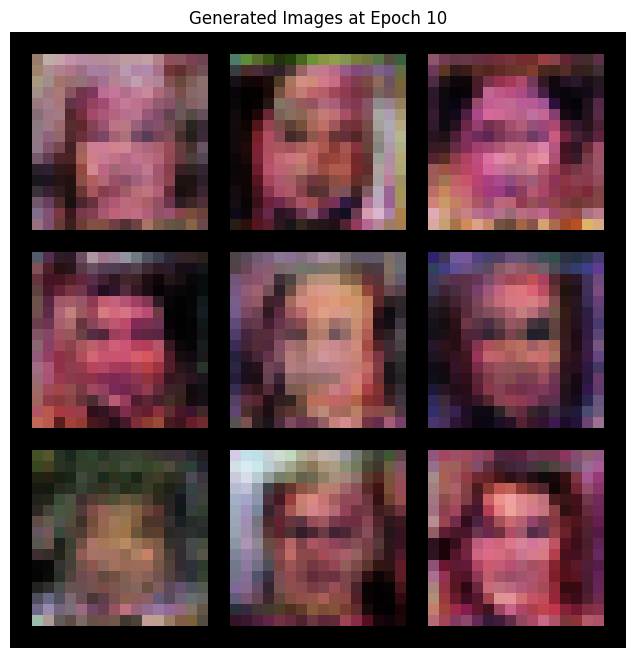

Epoch [12/45]


100%|██████████| 79/79 [00:14<00:00,  5.57it/s, alpha=0.533, gp=0.0192, loss_critic=-1.78, loss_gen=2.97]


Epoch [13/45]


100%|██████████| 79/79 [00:14<00:00,  5.58it/s, alpha=0.578, gp=0.0255, loss_critic=-1.43, loss_gen=3.18]


Epoch [14/45]


100%|██████████| 79/79 [00:14<00:00,  5.54it/s, alpha=0.622, gp=0.0257, loss_critic=-1.25, loss_gen=2.72]


Epoch [15/45]


100%|██████████| 79/79 [00:14<00:00,  5.55it/s, alpha=0.667, gp=0.0346, loss_critic=-1.33, loss_gen=2.38] 


Epoch [16/45]


100%|██████████| 79/79 [00:14<00:00,  5.56it/s, alpha=0.711, gp=0.0167, loss_critic=-1.69, loss_gen=7.49]


Epoch [17/45]


100%|██████████| 79/79 [00:14<00:00,  5.56it/s, alpha=0.756, gp=0.024, loss_critic=-1.62, loss_gen=2.27] 


Epoch [18/45]


100%|██████████| 79/79 [00:14<00:00,  5.56it/s, alpha=0.8, gp=0.0246, loss_critic=-1.42, loss_gen=2.56]  


Epoch [19/45]


100%|██████████| 79/79 [00:14<00:00,  5.55it/s, alpha=0.844, gp=0.0382, loss_critic=-.946, loss_gen=0.853]


Epoch [20/45]


100%|██████████| 79/79 [00:14<00:00,  5.55it/s, alpha=0.889, gp=0.0285, loss_critic=-1.42, loss_gen=1.45]


Epoch [21/45]


100%|██████████| 79/79 [00:14<00:00,  5.54it/s, alpha=0.933, gp=0.0249, loss_critic=-1.47, loss_gen=3.21]


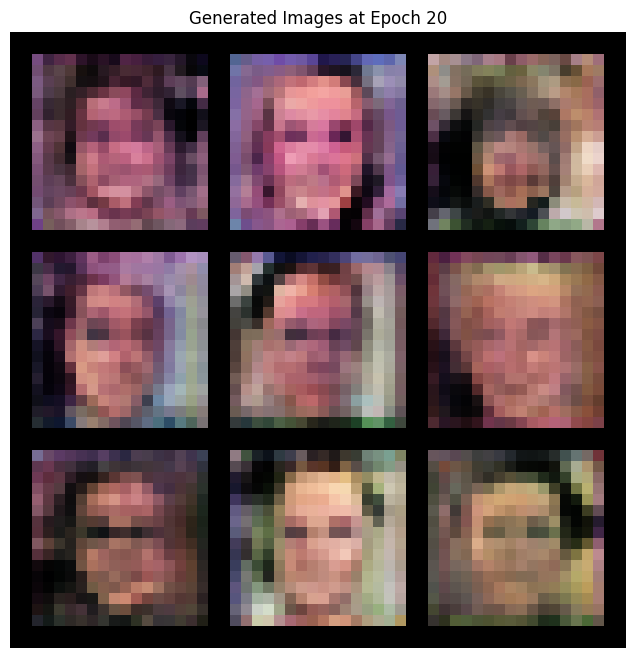

Epoch [22/45]


100%|██████████| 79/79 [00:14<00:00,  5.55it/s, alpha=0.978, gp=0.0285, loss_critic=-1.42, loss_gen=2]   


Epoch [23/45]


100%|██████████| 79/79 [00:14<00:00,  5.57it/s, alpha=1, gp=0.0147, loss_critic=-1.18, loss_gen=1.16]    


Epoch [24/45]


100%|██████████| 79/79 [00:14<00:00,  5.56it/s, alpha=1, gp=0.0103, loss_critic=-1.07, loss_gen=2.14] 


Epoch [25/45]


100%|██████████| 79/79 [00:14<00:00,  5.57it/s, alpha=1, gp=0.0109, loss_critic=-1.56, loss_gen=2.45] 


Epoch [26/45]


100%|██████████| 79/79 [00:14<00:00,  5.55it/s, alpha=1, gp=0.0353, loss_critic=-.883, loss_gen=1.56] 


Epoch [27/45]


100%|██████████| 79/79 [00:14<00:00,  5.54it/s, alpha=1, gp=0.0198, loss_critic=-1.04, loss_gen=0.788] 


Epoch [28/45]


100%|██████████| 79/79 [00:14<00:00,  5.57it/s, alpha=1, gp=0.00796, loss_critic=-.999, loss_gen=1.52] 


Epoch [29/45]


100%|██████████| 79/79 [00:14<00:00,  5.53it/s, alpha=1, gp=0.0255, loss_critic=-.447, loss_gen=1.97] 


Epoch [30/45]


100%|██████████| 79/79 [00:14<00:00,  5.56it/s, alpha=1, gp=0.0216, loss_critic=-1.09, loss_gen=1.71] 


Epoch [31/45]


100%|██████████| 79/79 [00:14<00:00,  5.54it/s, alpha=1, gp=0.0425, loss_critic=-.962, loss_gen=2.36] 


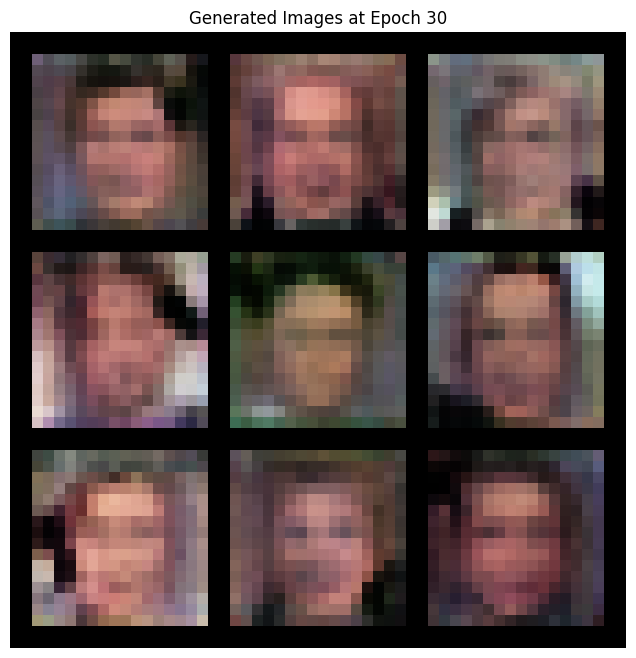

Epoch [32/45]


100%|██████████| 79/79 [00:14<00:00,  5.55it/s, alpha=1, gp=0.0115, loss_critic=-1.01, loss_gen=1.7]   


Epoch [33/45]


100%|██████████| 79/79 [00:14<00:00,  5.56it/s, alpha=1, gp=0.00947, loss_critic=-1.15, loss_gen=2.83] 


Epoch [34/45]


100%|██████████| 79/79 [00:14<00:00,  5.56it/s, alpha=1, gp=0.0184, loss_critic=-.658, loss_gen=1.11] 


Epoch [35/45]


100%|██████████| 79/79 [00:14<00:00,  5.55it/s, alpha=1, gp=0.024, loss_critic=-.65, loss_gen=1.53]    


Epoch [36/45]


100%|██████████| 79/79 [00:14<00:00,  5.53it/s, alpha=1, gp=0.0614, loss_critic=-.558, loss_gen=1.15] 


Epoch [37/45]


100%|██████████| 79/79 [00:14<00:00,  5.55it/s, alpha=1, gp=0.0529, loss_critic=-.78, loss_gen=1.06]   


Epoch [38/45]


100%|██████████| 79/79 [00:14<00:00,  5.54it/s, alpha=1, gp=0.0116, loss_critic=-.409, loss_gen=0.396] 


Epoch [39/45]


100%|██████████| 79/79 [00:14<00:00,  5.57it/s, alpha=1, gp=0.0144, loss_critic=-.873, loss_gen=1.57]  


Epoch [40/45]


100%|██████████| 79/79 [00:14<00:00,  5.45it/s, alpha=1, gp=0.00574, loss_critic=-.558, loss_gen=0.591]


Epoch [41/45]


100%|██████████| 79/79 [00:14<00:00,  5.56it/s, alpha=1, gp=0.00512, loss_critic=-.393, loss_gen=0.33] 


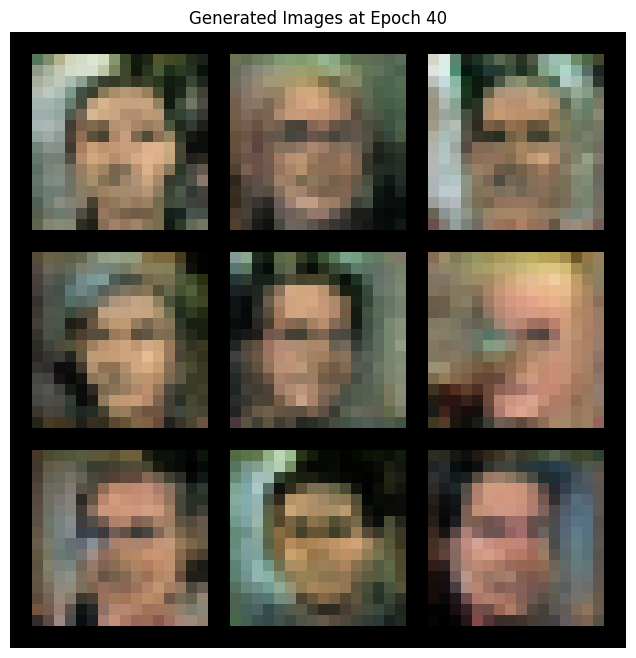

Epoch [42/45]


100%|██████████| 79/79 [00:14<00:00,  5.51it/s, alpha=1, gp=0.0389, loss_critic=-1.03, loss_gen=2.06]  


Epoch [43/45]


100%|██████████| 79/79 [00:14<00:00,  5.56it/s, alpha=1, gp=0.00862, loss_critic=-.504, loss_gen=0.747]


Epoch [44/45]


100%|██████████| 79/79 [00:14<00:00,  5.48it/s, alpha=1, gp=0.0184, loss_critic=-.527, loss_gen=1.51]  


Epoch [45/45]


100%|██████████| 79/79 [00:14<00:00,  5.56it/s, alpha=1, gp=0.00266, loss_critic=-1.14, loss_gen=1.82] 


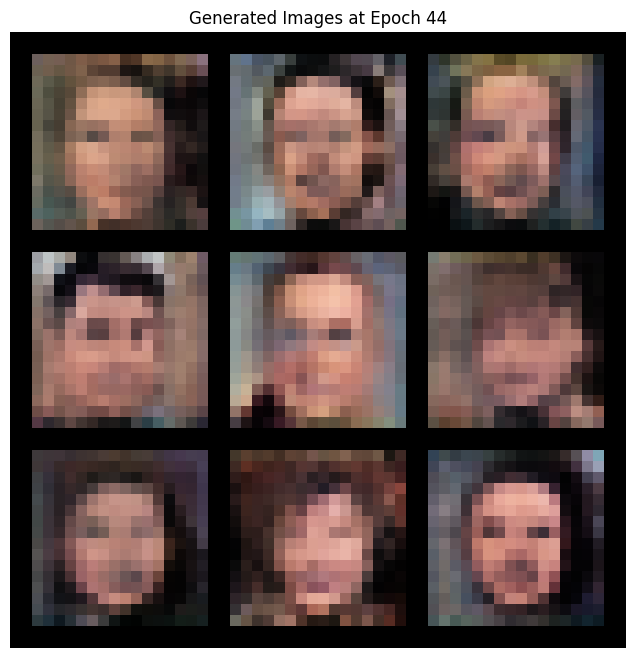

FID score at step 2: 29.283899307250977
PPL will be computed after training using saved weights.
Current image size: 32
Batch size: 64
Total epochs to run: 45
-----------------------------------------------
Epoch [1/45]


100%|██████████| 157/157 [00:42<00:00,  3.65it/s, alpha=0.0444, gp=0.06, loss_critic=-2.41, loss_gen=2.47]    


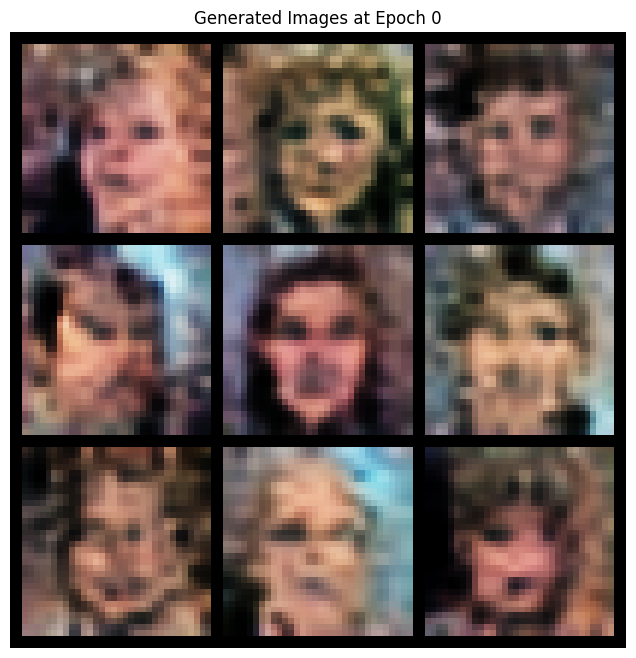

Epoch [2/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=0.0889, gp=0.0733, loss_critic=-1.23, loss_gen=0.257]


Epoch [3/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.133, gp=0.015, loss_critic=-1.12, loss_gen=2.57]  


Epoch [4/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.178, gp=0.0113, loss_critic=-1.37, loss_gen=1.26] 


Epoch [5/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=0.222, gp=0.0164, loss_critic=-1.33, loss_gen=1.12] 


Epoch [6/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=0.267, gp=0.012, loss_critic=-1.16, loss_gen=1.17]   


Epoch [7/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.311, gp=0.00967, loss_critic=-1.86, loss_gen=3.06] 


Epoch [8/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.356, gp=0.0938, loss_critic=-1.03, loss_gen=4.97] 


Epoch [9/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.4, gp=0.0103, loss_critic=-1.6, loss_gen=3.27]    


Epoch [10/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.444, gp=0.0206, loss_critic=-1.36, loss_gen=3.18] 


Epoch [11/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=0.489, gp=0.016, loss_critic=-1.33, loss_gen=2.54]   


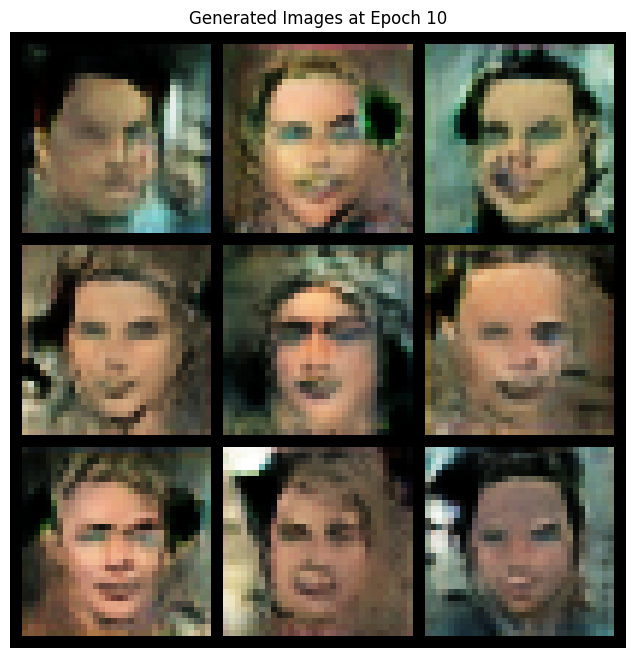

Epoch [12/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=0.533, gp=0.0864, loss_critic=-.944, loss_gen=3.31] 


Epoch [13/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.578, gp=0.00908, loss_critic=-1.19, loss_gen=3]   


Epoch [14/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.622, gp=0.0212, loss_critic=-1.35, loss_gen=1.56]  


Epoch [15/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.667, gp=0.0794, loss_critic=-1.05, loss_gen=1.96] 


Epoch [16/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=0.711, gp=0.0119, loss_critic=-.934, loss_gen=0.716]


Epoch [17/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=0.756, gp=0.0187, loss_critic=-1.54, loss_gen=1.78]  


Epoch [18/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.8, gp=0.0529, loss_critic=-.897, loss_gen=1.58]   


Epoch [19/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.844, gp=0.0435, loss_critic=-1.4, loss_gen=2.56]   


Epoch [20/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=0.889, gp=0.0356, loss_critic=-1.76, loss_gen=3.28] 


Epoch [21/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.933, gp=0.00902, loss_critic=-1.68, loss_gen=1.71]


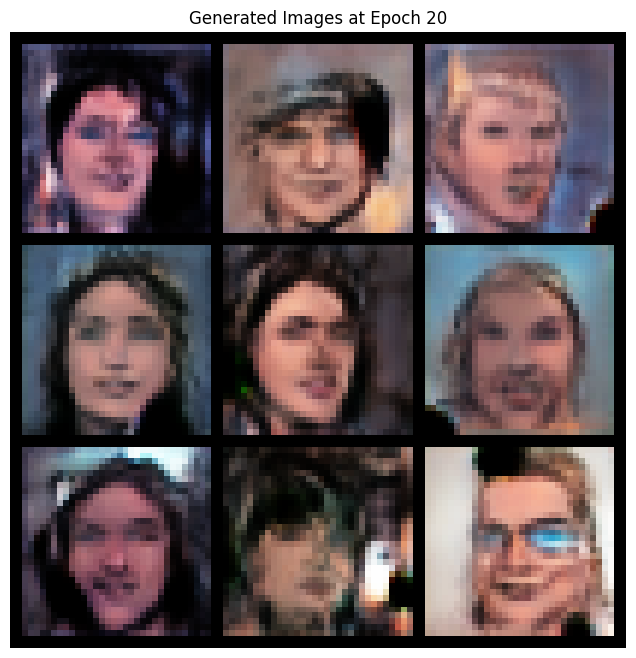

Epoch [22/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=0.978, gp=0.00376, loss_critic=-.978, loss_gen=3.3]  


Epoch [23/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.0515, loss_critic=-.721, loss_gen=2.15]     


Epoch [24/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.0656, loss_critic=-.742, loss_gen=1.06]  


Epoch [25/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.0162, loss_critic=-.706, loss_gen=1.87]  


Epoch [26/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.0642, loss_critic=-.605, loss_gen=1.97]  


Epoch [27/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=1, gp=0.0394, loss_critic=-.184, loss_gen=-.0254]


Epoch [28/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.00849, loss_critic=-.624, loss_gen=2.4]  


Epoch [29/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.0294, loss_critic=-.586, loss_gen=0.688] 


Epoch [30/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=1, gp=0.0206, loss_critic=-1.07, loss_gen=2.88]  


Epoch [31/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=1, gp=0.0541, loss_critic=-.343, loss_gen=1.28]  


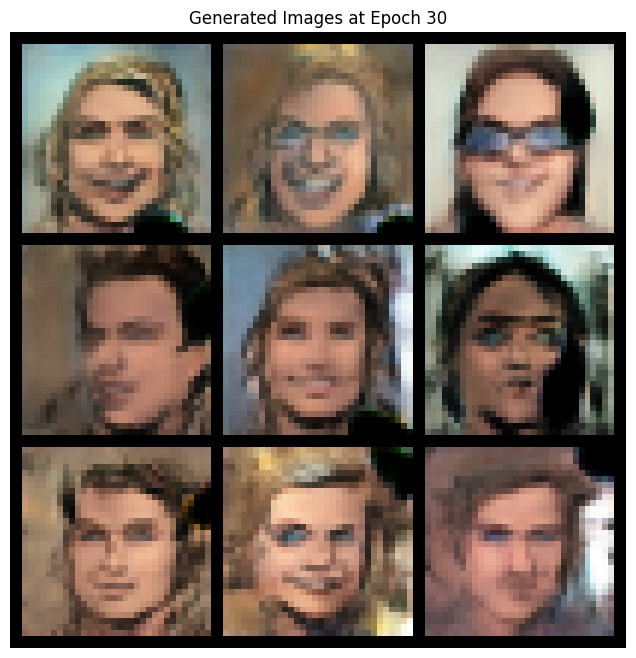

Epoch [32/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=1, gp=0.00463, loss_critic=-1.43, loss_gen=1.43] 


Epoch [33/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.00421, loss_critic=-1.29, loss_gen=2.83] 


Epoch [34/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.00889, loss_critic=-1.02, loss_gen=-.209]


Epoch [35/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=1, gp=0.00321, loss_critic=-.786, loss_gen=3.98]  


Epoch [36/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=1, gp=0.00899, loss_critic=-1.22, loss_gen=3.91]  


Epoch [37/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.00394, loss_critic=-.759, loss_gen=1.32] 


Epoch [38/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.0351, loss_critic=-1.08, loss_gen=2.26]   


Epoch [39/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.013, loss_critic=-.589, loss_gen=2.35]    


Epoch [40/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=1, gp=0.0204, loss_critic=-.761, loss_gen=0.342]   


Epoch [41/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=1, gp=0.00781, loss_critic=-.93, loss_gen=-.0472] 


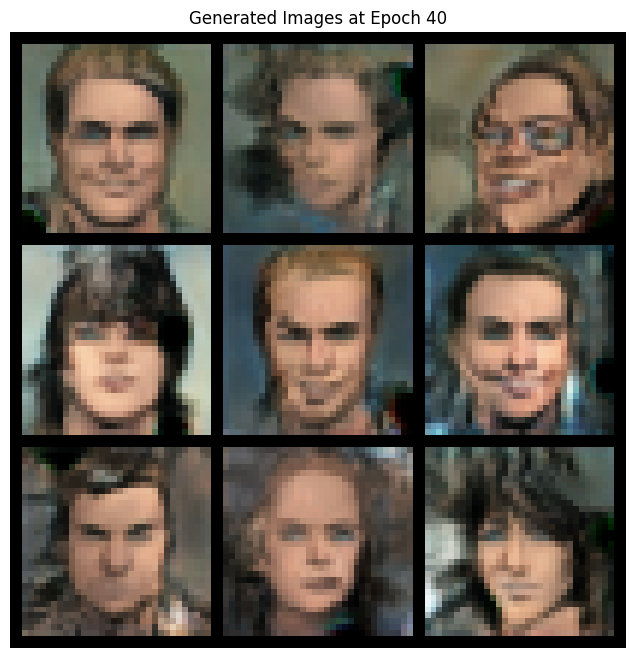

Epoch [42/45]


100%|██████████| 157/157 [00:42<00:00,  3.68it/s, alpha=1, gp=0.00766, loss_critic=-1.1, loss_gen=-.266] 


Epoch [43/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.0162, loss_critic=-1.15, loss_gen=4.46]  


Epoch [44/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.00777, loss_critic=-.734, loss_gen=-.433]


Epoch [45/45]


100%|██████████| 157/157 [00:42<00:00,  3.69it/s, alpha=1, gp=0.00894, loss_critic=-1.15, loss_gen=0.729]


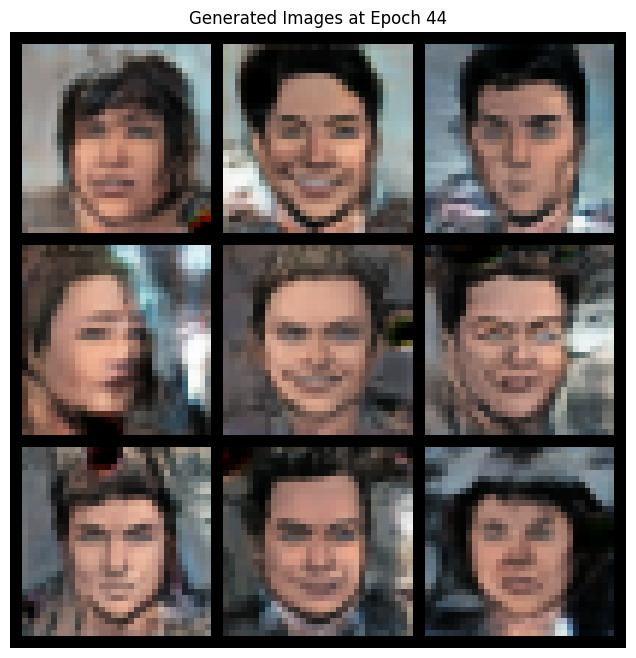

FID score at step 3: 24.011920928955078
PPL will be computed after training using saved weights.
Current image size: 64
Batch size: 32
Total epochs to run: 45
-----------------------------------------------
Epoch [1/45]


100%|██████████| 313/313 [01:36<00:00,  3.25it/s, alpha=0.0444, gp=0.0244, loss_critic=-2.91, loss_gen=12.6]   


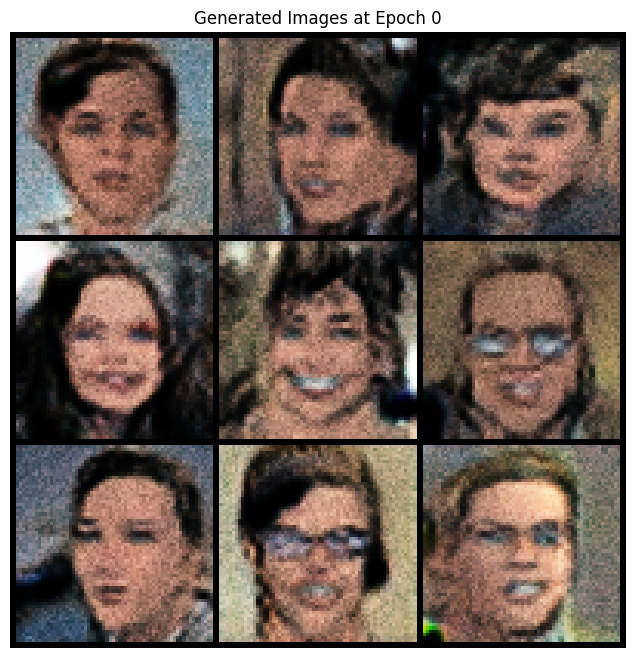

Epoch [2/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.0889, gp=0.0485, loss_critic=-2.44, loss_gen=4.18]  


Epoch [3/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.133, gp=0.0468, loss_critic=-3.33, loss_gen=-3.11] 


Epoch [4/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.178, gp=0.0388, loss_critic=-3.61, loss_gen=2.27] 


Epoch [5/45]


100%|██████████| 313/313 [01:35<00:00,  3.27it/s, alpha=0.222, gp=0.0306, loss_critic=-.536, loss_gen=-9.74] 


Epoch [6/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.267, gp=0.0193, loss_critic=-2.77, loss_gen=1]     


Epoch [7/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.311, gp=0.0243, loss_critic=-2.64, loss_gen=8.92]  


Epoch [8/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.356, gp=0.024, loss_critic=-4.08, loss_gen=-1.98]   


Epoch [9/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.4, gp=0.0434, loss_critic=-3.34, loss_gen=8.92]    


Epoch [10/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.444, gp=0.053, loss_critic=-2.77, loss_gen=6.41]  


Epoch [11/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.489, gp=0.0104, loss_critic=-3.47, loss_gen=4.62]   


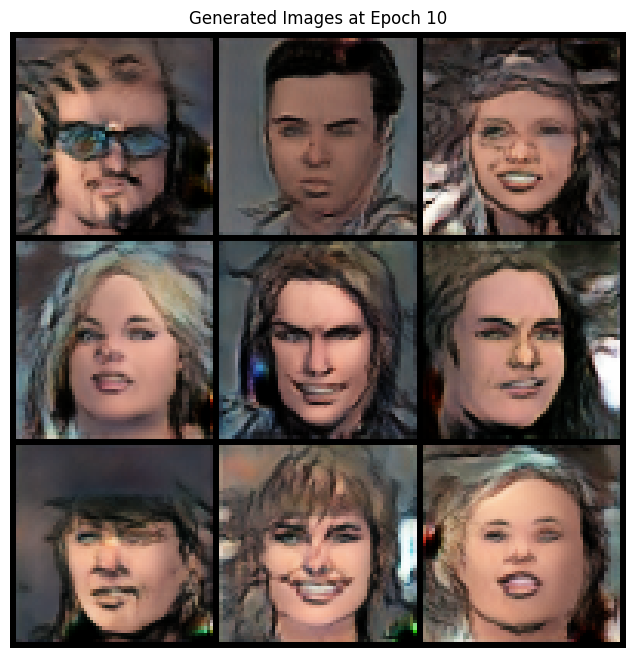

Epoch [12/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.533, gp=0.0219, loss_critic=-2.08, loss_gen=-.24] 


Epoch [13/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.578, gp=0.0161, loss_critic=-2.87, loss_gen=6.73]  


Epoch [14/45]


100%|██████████| 313/313 [01:35<00:00,  3.27it/s, alpha=0.622, gp=0.0214, loss_critic=-3.94, loss_gen=11.2]  


Epoch [15/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.667, gp=0.0114, loss_critic=-2.11, loss_gen=11.8]  


Epoch [16/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.711, gp=0.022, loss_critic=-2.43, loss_gen=2.08]   


Epoch [17/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.756, gp=0.0194, loss_critic=-1.74, loss_gen=15.7]  


Epoch [18/45]


100%|██████████| 313/313 [01:35<00:00,  3.27it/s, alpha=0.8, gp=0.0173, loss_critic=-2.34, loss_gen=4.33]    


Epoch [19/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.844, gp=0.0166, loss_critic=-2.71, loss_gen=-4.42] 


Epoch [20/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.889, gp=0.0211, loss_critic=-3.4, loss_gen=13.4]   


Epoch [21/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=0.933, gp=0.0219, loss_critic=-2.97, loss_gen=3.5]   


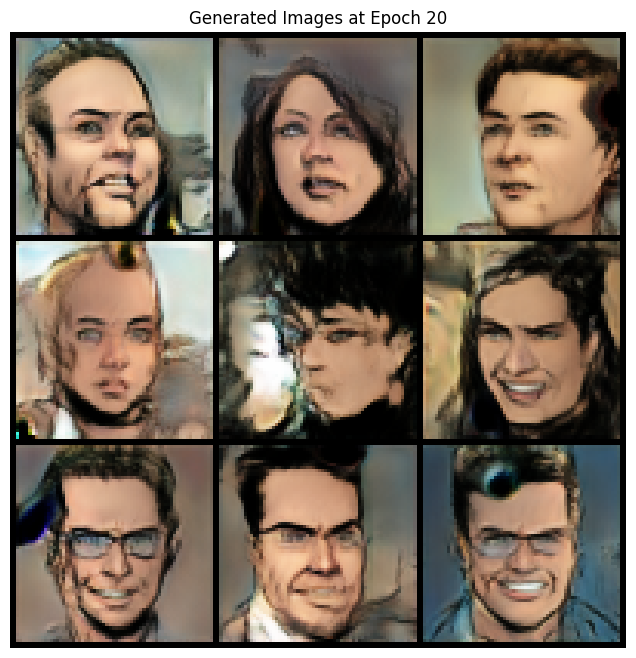

Epoch [22/45]


100%|██████████| 313/313 [01:35<00:00,  3.27it/s, alpha=0.978, gp=0.0268, loss_critic=-2.03, loss_gen=-4.26] 


Epoch [23/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0239, loss_critic=-2.41, loss_gen=11.3]      


Epoch [24/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.023, loss_critic=-1.64, loss_gen=-1.73]   


Epoch [25/45]


100%|██████████| 313/313 [01:35<00:00,  3.27it/s, alpha=1, gp=0.0161, loss_critic=-2.16, loss_gen=5.31]  


Epoch [26/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0305, loss_critic=-3.47, loss_gen=7.12]   


Epoch [27/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0238, loss_critic=-2.18, loss_gen=13.3]  


Epoch [28/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0163, loss_critic=-2.93, loss_gen=7.56]  


Epoch [29/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0174, loss_critic=-2.35, loss_gen=6.43]  


Epoch [30/45]


100%|██████████| 313/313 [01:35<00:00,  3.27it/s, alpha=1, gp=0.00874, loss_critic=-2.31, loss_gen=4.81]  


Epoch [31/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0372, loss_critic=-1.66, loss_gen=5.52]  


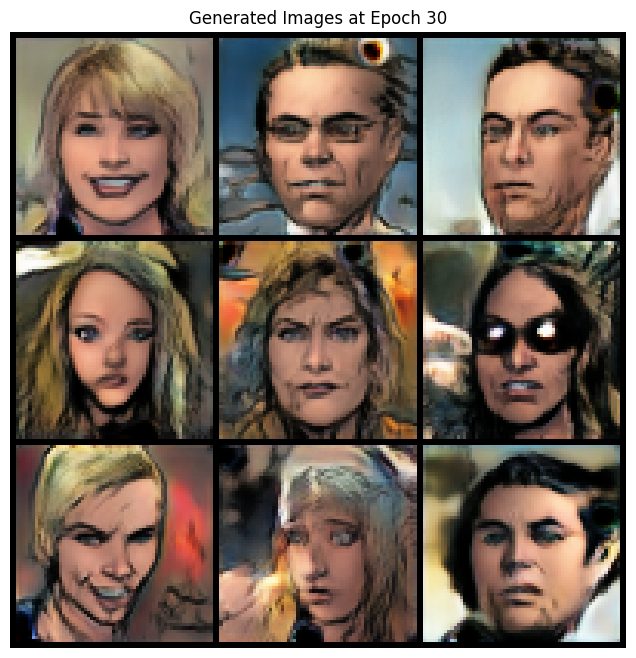

Epoch [32/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0247, loss_critic=-2.4, loss_gen=4.84]    


Epoch [33/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0124, loss_critic=-2.22, loss_gen=6.28]  


Epoch [34/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.00556, loss_critic=-1.94, loss_gen=11.7] 


Epoch [35/45]


100%|██████████| 313/313 [01:35<00:00,  3.27it/s, alpha=1, gp=0.00687, loss_critic=-2.29, loss_gen=2.83] 


Epoch [36/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.00635, loss_critic=-2.17, loss_gen=8.62] 


Epoch [37/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0114, loss_critic=-3.01, loss_gen=-.302]  


Epoch [38/45]


100%|██████████| 313/313 [01:36<00:00,  3.25it/s, alpha=1, gp=0.0141, loss_critic=-2.61, loss_gen=-3.64] 


Epoch [39/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0274, loss_critic=-2.48, loss_gen=-.332]  


Epoch [40/45]


100%|██████████| 313/313 [01:35<00:00,  3.27it/s, alpha=1, gp=0.0186, loss_critic=-1.45, loss_gen=7.96]   


Epoch [41/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0153, loss_critic=-1.77, loss_gen=-2.68] 


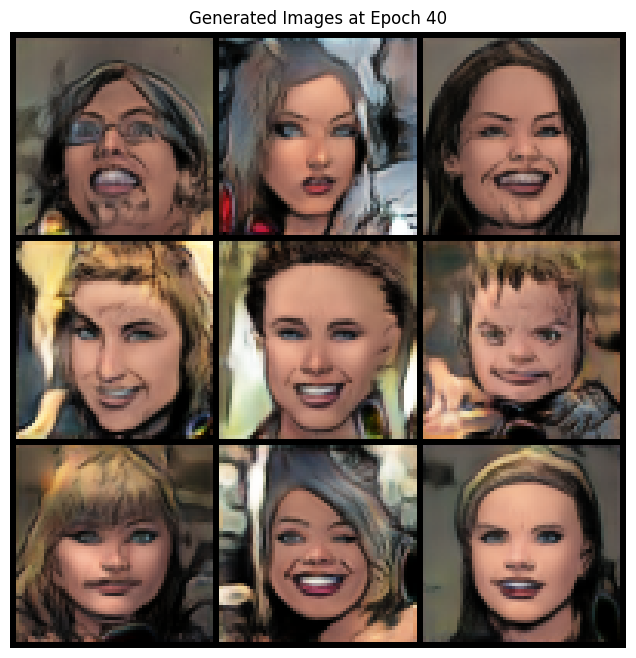

Epoch [42/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0162, loss_critic=-2.3, loss_gen=5.55]   


Epoch [43/45]


100%|██████████| 313/313 [01:35<00:00,  3.27it/s, alpha=1, gp=0.0168, loss_critic=-1.81, loss_gen=-7.53] 


Epoch [44/45]


100%|██████████| 313/313 [01:35<00:00,  3.26it/s, alpha=1, gp=0.0343, loss_critic=-2.24, loss_gen=11.4]  


Epoch [45/45]


100%|██████████| 313/313 [01:35<00:00,  3.27it/s, alpha=1, gp=0.035, loss_critic=-1.74, loss_gen=14.1]   


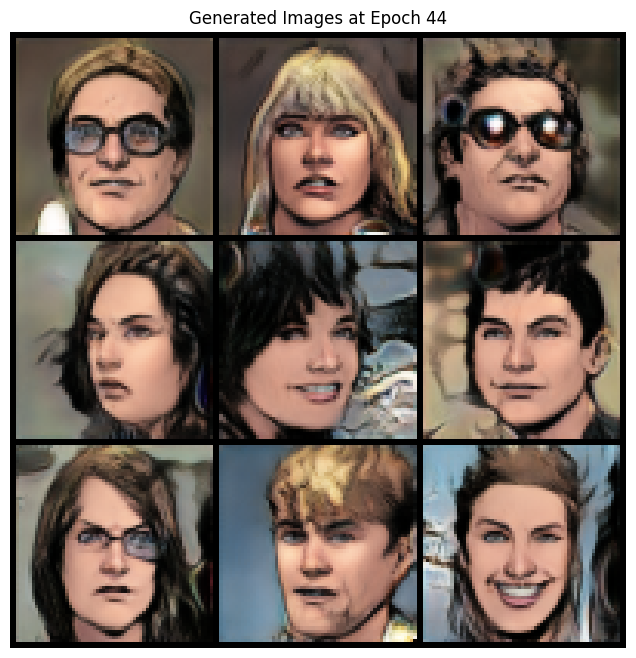

FID score at step 4: 20.040237426757812
PPL will be computed after training using saved weights.
Current image size: 128
Batch size: 16
Total epochs to run: 45
-----------------------------------------------
Epoch [1/45]


100%|██████████| 625/625 [02:48<00:00,  3.71it/s, alpha=0.0444, gp=0.0475, loss_critic=-3.66, loss_gen=31.9]   


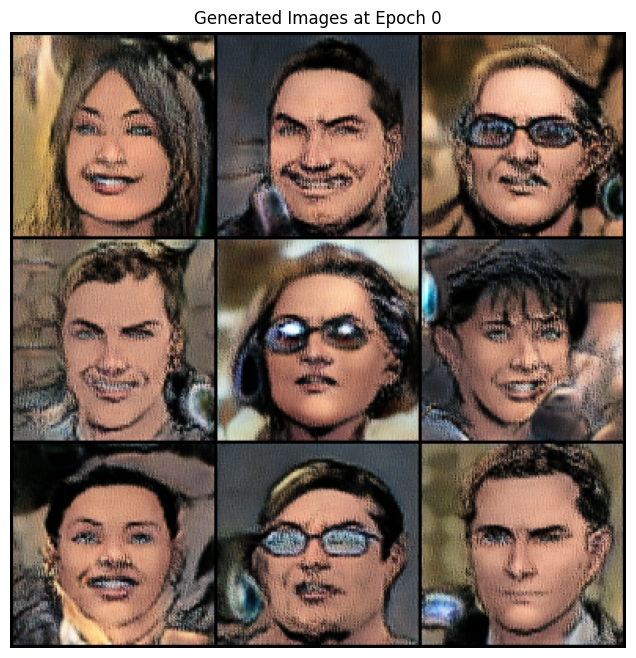

Epoch [2/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.0889, gp=0.0346, loss_critic=-5.26, loss_gen=26.3]  


Epoch [3/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.133, gp=0.0503, loss_critic=-6.98, loss_gen=23.4]   


Epoch [4/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.178, gp=0.051, loss_critic=-2.76, loss_gen=9.93]   


Epoch [5/45]


100%|██████████| 625/625 [02:48<00:00,  3.71it/s, alpha=0.222, gp=0.084, loss_critic=-6.4, loss_gen=27.6]    


Epoch [6/45]


100%|██████████| 625/625 [02:48<00:00,  3.71it/s, alpha=0.267, gp=0.0942, loss_critic=-3.69, loss_gen=12.7]  


Epoch [7/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.311, gp=0.0955, loss_critic=-5.6, loss_gen=16.4]   


Epoch [8/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.356, gp=0.0959, loss_critic=-5.91, loss_gen=-2.72]


Epoch [9/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.4, gp=0.0695, loss_critic=-4.08, loss_gen=15.2]   


Epoch [10/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.444, gp=0.0579, loss_critic=-6.19, loss_gen=13.5] 


Epoch [11/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.489, gp=0.047, loss_critic=-7.28, loss_gen=20.1]  


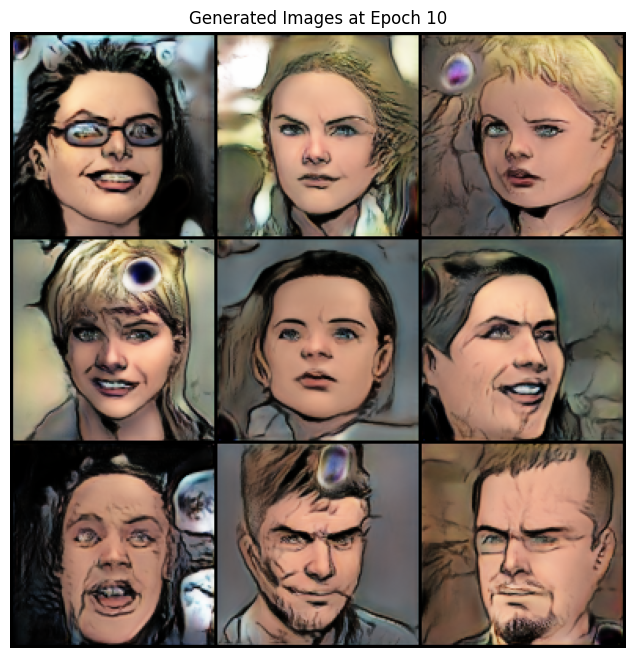

Epoch [12/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.533, gp=0.0611, loss_critic=-6.45, loss_gen=-15.6]  


Epoch [13/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.578, gp=0.0853, loss_critic=-5.28, loss_gen=22.1] 


Epoch [14/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.622, gp=0.0418, loss_critic=-7.35, loss_gen=-2.62] 


Epoch [15/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.667, gp=0.0355, loss_critic=-4.56, loss_gen=1.77]   


Epoch [16/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.711, gp=0.0859, loss_critic=-6.99, loss_gen=27.9] 


Epoch [17/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.756, gp=0.0994, loss_critic=-4.44, loss_gen=21.2]  


Epoch [18/45]


100%|██████████| 625/625 [02:48<00:00,  3.70it/s, alpha=0.8, gp=0.0454, loss_critic=-5.2, loss_gen=1.76]     


Epoch [19/45]


100%|██████████| 625/625 [02:48<00:00,  3.71it/s, alpha=0.844, gp=0.0666, loss_critic=-6.01, loss_gen=14.5]  


Epoch [20/45]


100%|██████████| 625/625 [02:48<00:00,  3.71it/s, alpha=0.889, gp=0.0355, loss_critic=-5.21, loss_gen=11.3]  


Epoch [21/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.933, gp=0.0809, loss_critic=-5.04, loss_gen=10.6]   


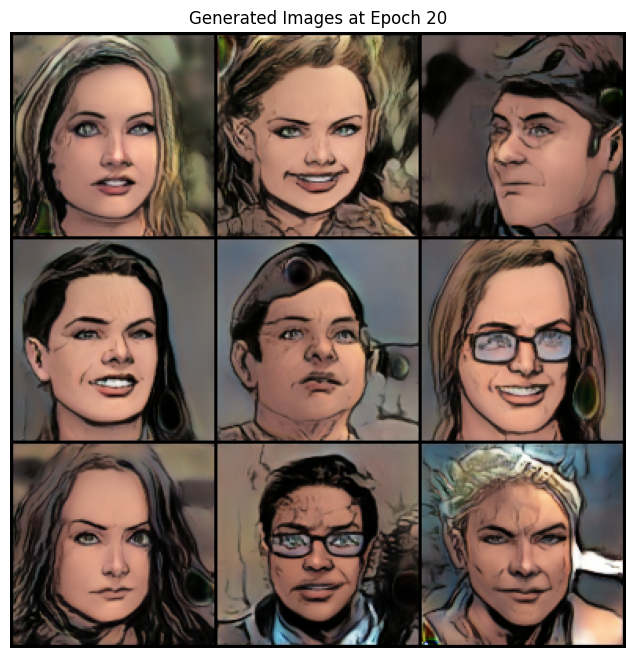

Epoch [22/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=0.978, gp=0.0533, loss_critic=-8.41, loss_gen=8.65]   


Epoch [23/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0563, loss_critic=-7.52, loss_gen=10.6]     


Epoch [24/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0536, loss_critic=-6.42, loss_gen=-5.94]  


Epoch [25/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0628, loss_critic=-6.92, loss_gen=-2.24] 


Epoch [26/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0976, loss_critic=-6.03, loss_gen=13.8]  


Epoch [27/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0482, loss_critic=-6.46, loss_gen=5.59]  


Epoch [28/45]


100%|██████████| 625/625 [02:48<00:00,  3.71it/s, alpha=1, gp=0.0637, loss_critic=-6.59, loss_gen=25.7]  


Epoch [29/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.071, loss_critic=-4.28, loss_gen=30.2]   


Epoch [30/45]


100%|██████████| 625/625 [02:48<00:00,  3.71it/s, alpha=1, gp=0.0711, loss_critic=-3.58, loss_gen=15.5]  


Epoch [31/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0365, loss_critic=-4.4, loss_gen=14.5]   


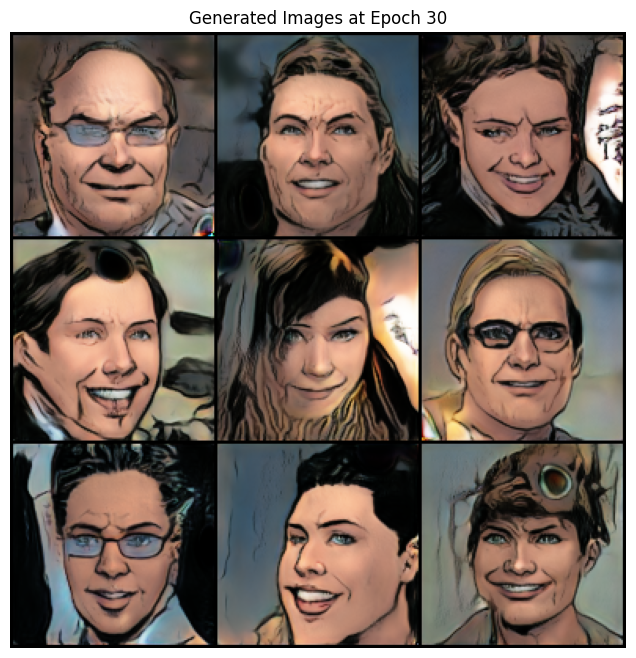

Epoch [32/45]


100%|██████████| 625/625 [02:48<00:00,  3.71it/s, alpha=1, gp=0.0801, loss_critic=-3.19, loss_gen=20.9]  


Epoch [33/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0319, loss_critic=-2.99, loss_gen=12.7]   


Epoch [34/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0441, loss_critic=-3.81, loss_gen=-11.3] 


Epoch [35/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0645, loss_critic=-5.98, loss_gen=18.2]  


Epoch [36/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0319, loss_critic=-5.6, loss_gen=-7.49]  


Epoch [37/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0596, loss_critic=-6.36, loss_gen=18.8]  


Epoch [38/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0467, loss_critic=-3.19, loss_gen=32.7]  


Epoch [39/45]


100%|██████████| 625/625 [02:48<00:00,  3.71it/s, alpha=1, gp=0.0303, loss_critic=-3.28, loss_gen=8.75] 


Epoch [40/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0432, loss_critic=-6.67, loss_gen=14.7]  


Epoch [41/45]


100%|██████████| 625/625 [02:48<00:00,  3.71it/s, alpha=1, gp=0.0565, loss_critic=-5.71, loss_gen=6.51]  


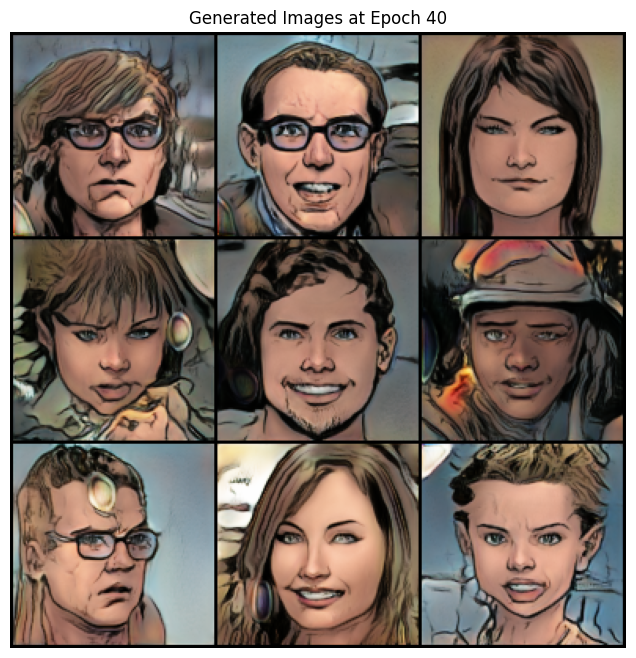

Epoch [42/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.109, loss_critic=-5.2, loss_gen=11.4]    


Epoch [43/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0814, loss_critic=-5.16, loss_gen=26.4]   


Epoch [44/45]


100%|██████████| 625/625 [02:48<00:00,  3.72it/s, alpha=1, gp=0.0304, loss_critic=-5.52, loss_gen=15.1]   


Epoch [45/45]


100%|██████████| 625/625 [02:48<00:00,  3.71it/s, alpha=1, gp=0.0486, loss_critic=-4.23, loss_gen=14.4]  


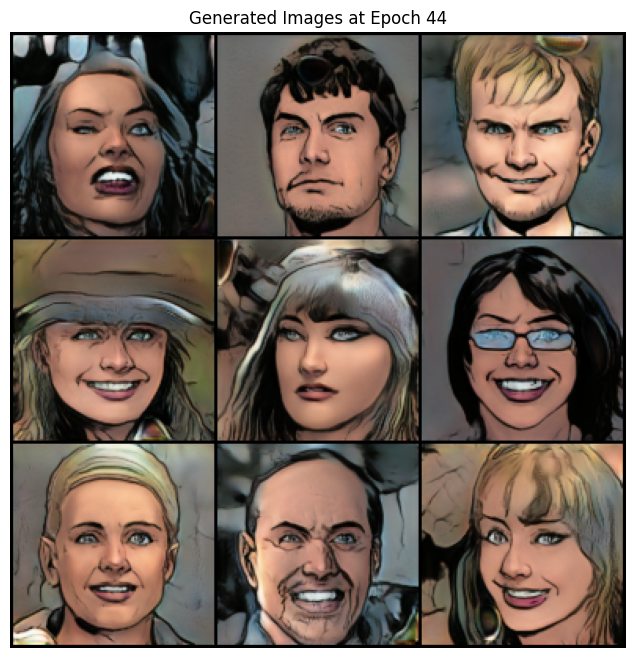

FID score at step 5: 13.02241039276123
PPL will be computed after training using saved weights.
Current image size: 256
Batch size: 8
Total epochs to run: 45
-----------------------------------------------
Epoch [1/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.0444, gp=0.142, loss_critic=-18.3, loss_gen=5.18]   


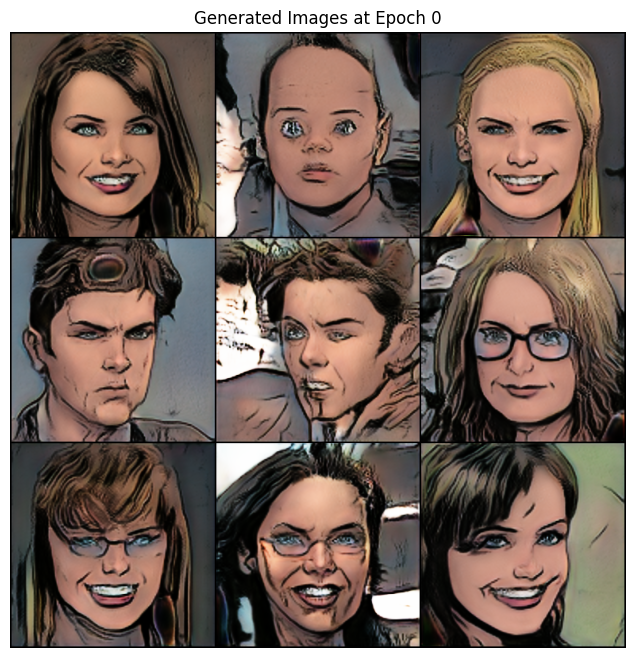

Epoch [2/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.0889, gp=0.263, loss_critic=-10.7, loss_gen=33.5]  


Epoch [3/45]


100%|██████████| 1250/1250 [06:51<00:00,  3.04it/s, alpha=0.133, gp=0.175, loss_critic=-10.2, loss_gen=3.16] 


Epoch [4/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.178, gp=0.218, loss_critic=-15.7, loss_gen=40.3]   


Epoch [5/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.222, gp=0.198, loss_critic=-9.4, loss_gen=34.8]  


Epoch [6/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.267, gp=0.219, loss_critic=-16.9, loss_gen=24.8]   


Epoch [7/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.311, gp=0.242, loss_critic=-17.5, loss_gen=11.7]  


Epoch [8/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.356, gp=0.211, loss_critic=-.552, loss_gen=31.8]  


Epoch [9/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.4, gp=0.227, loss_critic=-7.27, loss_gen=13.3]   


Epoch [10/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.444, gp=0.161, loss_critic=-18.2, loss_gen=33.4] 


Epoch [11/45]


100%|██████████| 1250/1250 [06:51<00:00,  3.04it/s, alpha=0.489, gp=0.173, loss_critic=-12.9, loss_gen=-5.15]  


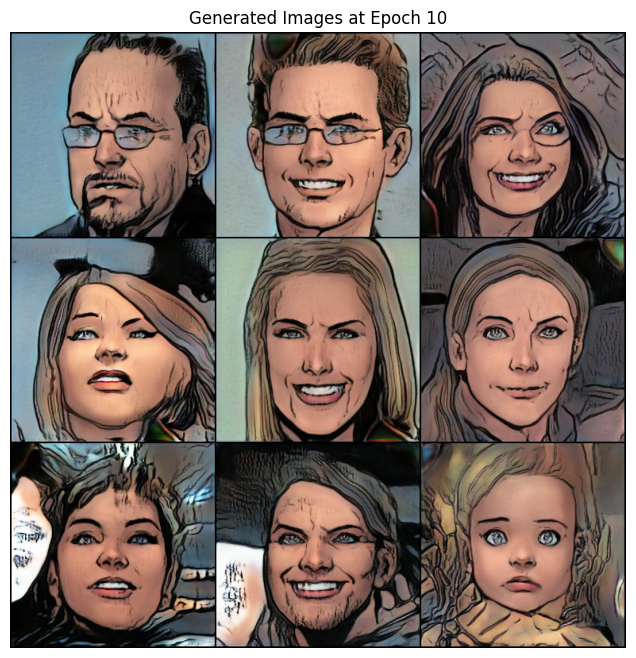

Epoch [12/45]


100%|██████████| 1250/1250 [06:54<00:00,  3.02it/s, alpha=0.533, gp=0.129, loss_critic=-14.3, loss_gen=13.3]  


Epoch [13/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.578, gp=0.277, loss_critic=-18.4, loss_gen=26.6]  


Epoch [14/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.622, gp=0.294, loss_critic=-21.5, loss_gen=51.5]  


Epoch [15/45]


100%|██████████| 1250/1250 [06:50<00:00,  3.05it/s, alpha=0.667, gp=0.189, loss_critic=-7.92, loss_gen=26.9] 


Epoch [16/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.711, gp=0.24, loss_critic=-5.74, loss_gen=41.5]   


Epoch [17/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.756, gp=0.147, loss_critic=-18.7, loss_gen=40.8] 


Epoch [18/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.8, gp=0.195, loss_critic=-19.6, loss_gen=29.8]    


Epoch [19/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.844, gp=0.214, loss_critic=-11.3, loss_gen=21.6]  


Epoch [20/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.889, gp=0.461, loss_critic=-8.51, loss_gen=43.7] 


Epoch [21/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.933, gp=0.269, loss_critic=-.537, loss_gen=-24.7]


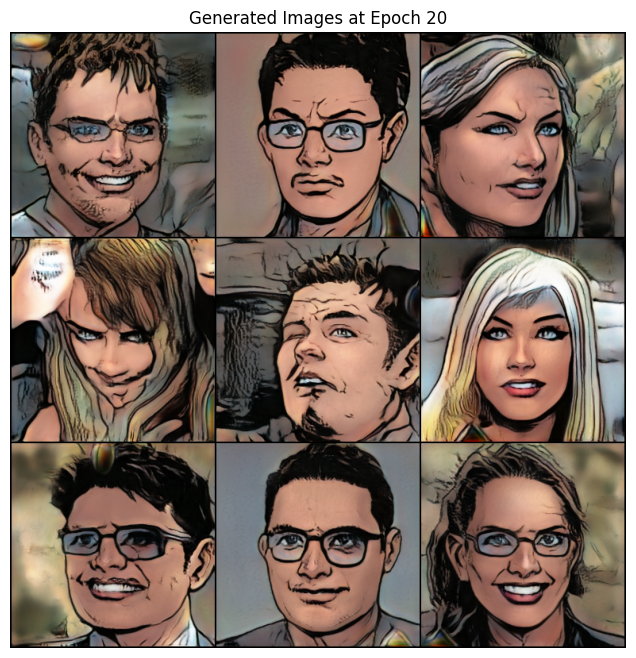

Epoch [22/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=0.978, gp=0.356, loss_critic=-13, loss_gen=28.3]    


Epoch [23/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.283, loss_critic=-7.86, loss_gen=-18.1]    


Epoch [24/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.184, loss_critic=-12.9, loss_gen=22.8] 


Epoch [25/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.0585, loss_critic=-4.36, loss_gen=2.23]


Epoch [26/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.32, loss_critic=-17, loss_gen=23]       


Epoch [27/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.523, loss_critic=-3.51, loss_gen=30.3]  


Epoch [28/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.151, loss_critic=-2.46, loss_gen=5.44]  


Epoch [29/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.222, loss_critic=-13, loss_gen=43.3]     


Epoch [30/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.433, loss_critic=-26.9, loss_gen=83.4]  


Epoch [31/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.22, loss_critic=-2.55, loss_gen=34.7]    


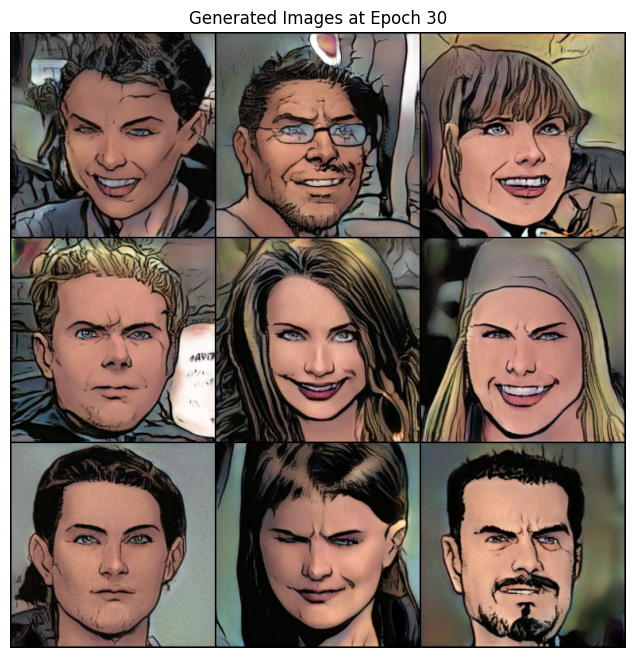

Epoch [32/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.194, loss_critic=-10.2, loss_gen=-13.6] 


Epoch [33/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.298, loss_critic=-13.8, loss_gen=11.2] 


Epoch [34/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.242, loss_critic=-16.4, loss_gen=11.4] 


Epoch [35/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.249, loss_critic=3.41, loss_gen=44]    


Epoch [36/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.211, loss_critic=-11.8, loss_gen=37.3]  


Epoch [37/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.218, loss_critic=-16.9, loss_gen=47.2] 


Epoch [38/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.296, loss_critic=-17.6, loss_gen=49.5]  


Epoch [39/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.335, loss_critic=-17.8, loss_gen=15.4] 


Epoch [40/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.31, loss_critic=-13.4, loss_gen=21.7]  


Epoch [41/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.285, loss_critic=-13, loss_gen=16.5]   


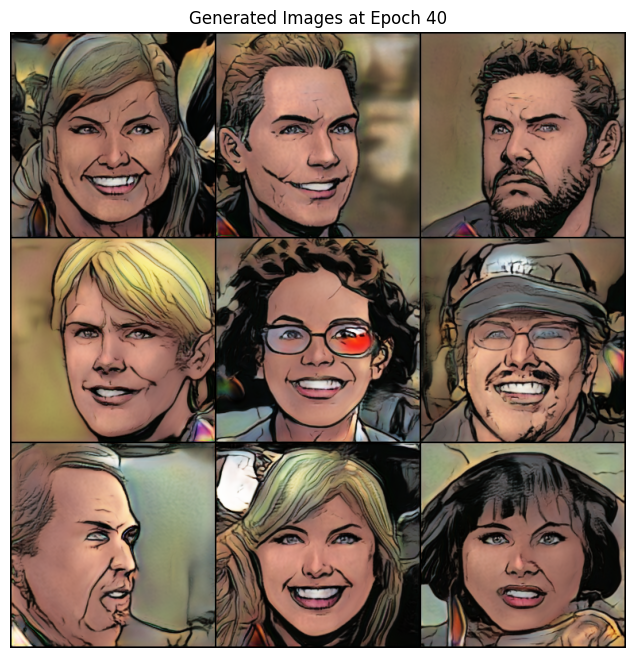

Epoch [42/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.278, loss_critic=-10.4, loss_gen=35.8] 


Epoch [43/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.159, loss_critic=-.0467, loss_gen=-9.19]


Epoch [44/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.302, loss_critic=-12.2, loss_gen=12.7] 


Epoch [45/45]


100%|██████████| 1250/1250 [06:49<00:00,  3.05it/s, alpha=1, gp=0.328, loss_critic=-10.6, loss_gen=20.4] 


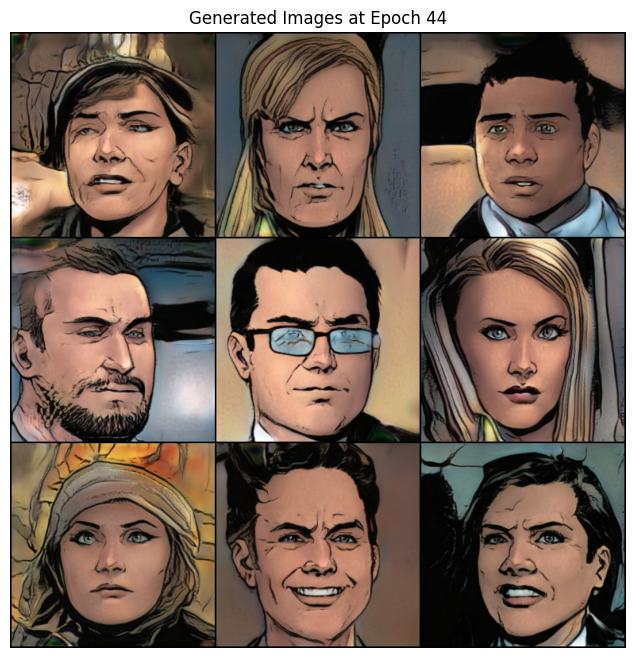

FID score at step 6: 8.004969596862793
PPL will be computed after training using saved weights.


In [12]:
# Initialize a list to keep track of metrics
metrics_summary = []

step = int(log2(START_TRAIN_IMG_SIZE / 4))
for num_epochs in PROGRESSIVE_EPOCHS[step:]:
    alpha = 1e-7
    image_size = 4 * 2 ** step
    loader, dataset = get_loader(image_size)
    batch_size = BATCH_SIZES[step]
    print(f'Current image size: {image_size}')
    print(f'Batch size: {batch_size}')
    print(f'Total epochs to run: {num_epochs}')
    print('-----------------------------------------------')

    gen_losses = []
    critic_losses = []

    # Variables to store the last epoch's metrics
    last_epoch_gen_loss = None
    last_epoch_critic_loss = None

    for epoch in range(num_epochs):
        print(f'Epoch [{epoch + 1}/{num_epochs}]')
        alpha, avg_loss_critic, avg_loss_gen = train_fn(
            critic, gen, loader, dataset, step, alpha, opt_critic, opt_gen
        )
        gen_losses.append(avg_loss_gen)
        critic_losses.append(avg_loss_critic)

        # Save generated images at each epoch
        with torch.no_grad():
            noise = torch.randn(9, Z_DIM).to(DEVICE)
            fake_images = gen(noise, alpha, step)
            fake_images = fake_images * 0.5 + 0.5  # Denormalize
            save_image(fake_images, f"saved_images_part1/step{step}_epoch{epoch}.png", nrow=3)

        # Save the models at each epoch
        torch.save(gen.state_dict(), f"saved_weight_part1/gen_step{step}_epoch{epoch}.pt")
        torch.save(critic.state_dict(), f"saved_weight_part1/critic_step{step}_epoch{epoch}.pt")

        # Display the images every 10 epochs
        if epoch % 10 == 0 or epoch == num_epochs - 1:
            # Display the images
            grid_img = torchvision.utils.make_grid(fake_images, nrow=3)
            plt.figure(figsize=(8, 8))
            plt.imshow(grid_img.permute(1, 2, 0).cpu().numpy())
            plt.title(f"Generated Images at Epoch {epoch}")
            plt.axis('off')
            plt.show()

        # Store the last epoch's losses
        last_epoch_gen_loss = avg_loss_gen
        last_epoch_critic_loss = avg_loss_critic

    # Generate examples after each step (resolution change)
    generate_examples(gen, step)

    # Plot and save losses
    plt.figure()
    plt.plot(gen_losses, label='Generator Loss')
    plt.plot(critic_losses, label='Discriminator Loss')
    plt.legend()
    plt.title(f"Losses at step {step}")
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.savefig(f"losses_step{step}.png")
    plt.close()

    # Compute FID
    fid_score = compute_fid_score(gen, loader, step)
    print(f"FID score at step {step}: {fid_score}")
    with open("fid_scores.txt", "a") as f:
        f.write(f"Step {step}: FID = {fid_score}\n")

    # Skip PPL computation during training
    ppl_score = None
    print(f"PPL will be computed after training using saved weights.")

    # Save metrics for summary, including last epoch's losses
    metrics_summary.append({
        'Step': step,
        'Image Size': image_size,
        'Batch Size': batch_size,
        'Total Epochs': num_epochs,
        'FID': fid_score,
        'PPL': ppl_score,  # Set to None for now
        'Last Epoch Gen Loss': last_epoch_gen_loss,
        'Last Epoch Critic Loss': last_epoch_critic_loss
    })

    step += 1

In [ ]:
# After Training: Compute PPL using saved weights
print('===============================================')
print('Training Completed. Computing PPL using saved weights.')

def compute_ppl_from_saved_weights(generator_checkpoint_path, step, num_samples=10000, eps=1e-4, batch_size=10):
    # Load the generator model
    gen = Generator(Z_DIM, W_DIM, IN_CHANNELS, CHANNELS_IMG).to(DEVICE)
    gen.load_state_dict(torch.load(generator_checkpoint_path))
    gen.eval()
    loss_fn = lpips.LPIPS(net='vgg').to(DEVICE)
    
    distances = []
    n_batches = num_samples // batch_size
    alpha = 1.0  # Use full contribution from the new block

    for _ in tqdm(range(n_batches), desc=f'Computing PPL for step {step}'):
        z1 = torch.randn(batch_size, Z_DIM).to(DEVICE)
        z2 = z1 + eps * torch.randn_like(z1).to(DEVICE)
        with torch.no_grad():
            img1 = gen(z1, alpha, step)
            img2 = gen(z2, alpha, step)
        dist = loss_fn(img1, img2)
        distances.append(dist.view(-1))
    distances = torch.cat(distances)
    ppl_score = (distances ** 2).mean().sqrt().item() / (eps ** 2)
    return ppl_score

# Compute PPL for each saved model at the last epoch of each step
for metric in metrics_summary:
    step = metric['Step']
    image_size = metric['Image Size']
    generator_checkpoint_path = f'saved_weight_part1/gen_step{step}_epoch{PROGRESSIVE_EPOCHS[step]-1}.pt'
    print(f"Computing PPL for step {step} with image size {image_size}...")
    ppl_score = compute_ppl_from_saved_weights(generator_checkpoint_path, step)
    metric['PPL'] = ppl_score  # Update the PPL score in metrics summary
    print(f"PPL Score for step {step}: {ppl_score}")

print('===============================================')


In [13]:
# Print metrics after training is completed
print('===============================================')
print('Final Metrics for Each Step:')
for metric in metrics_summary:
    print('-----------------------------------------------')
    print(f"Step {metric['Step']}:")
    print(f"Image Size: {metric['Image Size']}")
    print(f"Batch Size: {metric['Batch Size']}")
    print(f"Total Epochs Run: {metric['Total Epochs']}")
    print(f"Last Epoch Generator Loss: {metric['Last Epoch Gen Loss']:.4f}")
    print(f"Last Epoch Critic Loss: {metric['Last Epoch Critic Loss']:.4f}")
    print(f"FID Score: {metric['FID']:.4f}")
    if metric['PPL'] is not None:
        print(f"PPL Score: {metric['PPL']:.4f}")
    else:
        print("PPL Score: Not computed")
print('===============================================')


Final Metrics for Each Step:
-----------------------------------------------
Step 0:
Image Size: 4
Batch Size: 256
Total Epochs Run: 45
Last Epoch Generator Loss: 0.9262
Last Epoch Critic Loss: -0.6587
FID Score: 31.0571
PPL Score: Not computed
-----------------------------------------------
Step 1:
Image Size: 8
Batch Size: 256
Total Epochs Run: 45
Last Epoch Generator Loss: 0.9646
Last Epoch Critic Loss: -0.6626
FID Score: 23.7452
PPL Score: Not computed
-----------------------------------------------
Step 2:
Image Size: 16
Batch Size: 128
Total Epochs Run: 45
Last Epoch Generator Loss: 1.0355
Last Epoch Critic Loss: -0.5925
FID Score: 29.2839
PPL Score: Not computed
-----------------------------------------------
Step 3:
Image Size: 32
Batch Size: 64
Total Epochs Run: 45
Last Epoch Generator Loss: 2.2296
Last Epoch Critic Loss: -1.1482
FID Score: 24.0119
PPL Score: Not computed
-----------------------------------------------
Step 4:
Image Size: 64
Batch Size: 32
Total Epochs Run: 45